## **Hotel Booking Demand Prediction**


## Get the Hotel booking dataset

**1. From Kaggle:**

https://www.kaggle.com/datasets/jessemostipak/hotel-booking-demand

This data set contains booking information for a city hotel and a resort hotel, and includes information such as when the booking was made, length of stay, the number of adults, children, and/or babies, and the number of available parking spaces, among other things.

**2. From Weather API:**


**3. From Events/Holidays data API:**





In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
hotel_bookings_df = pd.read_csv('hotel_bookings.csv')
hotel_bookings_df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
hotel_bookings_df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [ ]:
hotel_bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [ ]:
hotel_bookings_df['market_segment'].unique()

array(['Direct', 'Corporate', 'Online TA', 'Offline TA/TO',
       'Complementary', 'Groups', 'Undefined', 'Aviation'], dtype=object)

In [ ]:
hotel_bookings_df['arrival_date'] = pd.to_datetime(
    hotel_bookings_df['arrival_date_year'].astype(str) + '-' +
    hotel_bookings_df['arrival_date_month'] + '-' +
    hotel_bookings_df['arrival_date_day_of_month'].astype(str),
    format='%Y-%B-%d'
)


In [ ]:
# Step 2: Extract `origin_country` from the `country` column
hotel_bookings_df['origin_country'] = hotel_bookings_df['country']

# Step 3: Assign `arrival_location` based on the `hotel` column
hotel_bookings_df['arrival_location'] = hotel_bookings_df['hotel'].apply(
    lambda x: 'Lisbon, Portugal' if x == 'City Hotel' else 'Faro, Portugal'
)





In [ ]:
# Prepare unique combinations for Lisbon, Portugal
lisbon_data = hotel_bookings_df[hotel_bookings_df['arrival_location'] == 'Lisbon, Portugal']
lisbon_unique = lisbon_data[['arrival_date']].drop_duplicates()

# Prepare unique combinations for Faro, Portugal
faro_data = hotel_bookings_df[hotel_bookings_df['arrival_location'] == 'Faro, Portugal']
faro_unique = faro_data[['arrival_date']].drop_duplicates()


## **Extracting Weather Data using Weather API from Visualcrossing**




In [ ]:
import requests
from io import StringIO
import pandas as pd

def fetch_and_save_weather(api_key, location, start_date, end_date, output_file):
    """
    Fetch weather data for a location over a date range and save to a CSV file.

    Parameters:
    - api_key: Your Visual Crossing API key.
    - location: The location (e.g., "Lisbon, Portugal").
    - start_date: The start date (YYYY-MM-DD).
    - end_date: The end date (YYYY-MM-DD).
    - output_file: Name of the file to save the weather data.

    Returns:
    - weather_df: A DataFrame containing the weather data.
    """
    base_url = "https://weather.visualcrossing.com/VisualCrossingWebServices/rest/services/timeline"
    request_url = f"{base_url}/{location}/{start_date}/{end_date}?unitGroup=metric&include=days&key={api_key}&contentType=csv"

    print(f"Fetching weather data for {location} from {start_date} to {end_date}")
    response = requests.get(request_url)

    if response.status_code == 200:
        data = StringIO(response.text)
        weather_df = pd.read_csv(data)
        # Save to CSV
        weather_df.to_csv(output_file, index=False)
        print(f"Weather data saved to '{output_file}'")
        return weather_df
    else:
        print(f"Failed to fetch data for {location}: {response.status_code}")
        return None


In [ ]:
# # Configuration
# api_key = "NG4YBQ7MRFZLMHM6G8N3KSF8H"

# # Date ranges for Lisbon and Faro
# lisbon_start_date = lisbon_unique['arrival_date'].min().strftime('%Y-%m-%d')
# lisbon_end_date = lisbon_unique['arrival_date'].max().strftime('%Y-%m-%d')
# faro_start_date = faro_unique['arrival_date'].min().strftime('%Y-%m-%d')
# faro_end_date = faro_unique['arrival_date'].max().strftime('%Y-%m-%d')

# # Fetch weather data for Lisbon
# lisbon_weather_df = fetch_and_save_weather(
#     api_key, "Lisbon, Portugal", lisbon_start_date, lisbon_end_date, "lisbon_weather.csv"
# )

# # Fetch weather data for Faro
# faro_weather_df = fetch_and_save_weather(
#     api_key, "Faro, Portugal", faro_start_date, faro_end_date, "faro_weather.csv"
# )


Fetching weather data for Lisbon, Portugal from 2015-07-01 to 2017-08-31
Weather data saved to 'lisbon_weather.csv'
Fetching weather data for Faro, Portugal from 2015-07-01 to 2017-08-31
Weather data saved to 'faro_weather.csv'


In [ ]:
# Combine Lisbon and Faro weather data
if lisbon_weather_df is not None and faro_weather_df is not None:
    combined_weather_df = pd.concat([lisbon_weather_df, faro_weather_df], ignore_index=True)
    combined_weather_df.to_csv('combined_weather_data.csv', index=False)
    print("Combined weather data saved to 'combined_weather_data.csv'")
else:
    print("Failed to fetch weather data for one or more locations.")


Combined weather data saved to 'combined_weather_data.csv'


In [ ]:
combined_weather_df.columns

Index(['name', 'datetime', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob',
       'precipcover', 'preciptype', 'snow', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'severerisk', 'sunrise',
       'sunset', 'moonphase', 'conditions', 'description', 'icon', 'stations'],
      dtype='object')

In [ ]:
# # Save the combined weather data to a CSV file
# combined_weather_df.to_csv('combined_weather_data.csv', index=False)
# print("Combined weather data saved to 'combined_weather_data.csv'.")


In [ ]:
def process_combined_weather_data(weather_df):
    """
    Select and rename relevant columns from the combined weather data.
    """
    weather_df['forecast_date'] = pd.to_datetime(weather_df['datetime']).dt.date

    return weather_df[[
        'forecast_date',  # Date of the weather data
        'name',       # Location of the weather data
        'temp',           # Average temperature
        'tempmin',        # Minimum temperature
        'tempmax',        # Maximum temperature
        'feelslike',      # Average "feels like" temperature
        'humidity',       # Humidity level as a percentage
        'precip',         # Total precipitation in mm
        'precipprob',     # Probability of precipitation
        'snow',           # Snowfall amount in mm
        'windgust',       # Maximum wind gust speed in km/h
        'windspeed',      # Average wind speed in km/h
        'visibility',     # Visibility in km
        'cloudcover',     # Percentage of cloud cover
        'conditions',     # General weather conditions (e.g., "Rain", "Cloudy")
    ]].rename(columns={
        'temp': 'avg_temp',
        'tempmin': 'min_temp',
        'tempmax': 'max_temp',
        'feelslike': 'feels_like_temp',
        'precip': 'precipitation',
        'precipprob': 'precipitation_probability',
        'snow': 'snowfall',
        'windgust': 'max_wind_gust',
        'windspeed': 'avg_wind_speed',
        'visibility': 'visibility_km',
        'cloudcover': 'cloud_cover',
        'conditions': 'weather_conditions'
    })


In [ ]:
# # Process the combined weather data
# processed_weather_df = process_combined_weather_data(combined_weather_df)

# # Save the processed data
# processed_weather_df.to_csv('processed_combined_weather_data.csv', index=False)
# print("Processed combined weather data saved to 'processed_combined_weather_data.csv'.")


Processed combined weather data saved to 'processed_combined_weather_data.csv'.


In [ ]:
processed_weather_df = pd.read_csv('processed_combined_weather_data.csv')

processed_weather_df['name'] = processed_weather_df['name'].apply(lambda x: 'Lisbon, Portugal' if x == 'Lisboa, Portugal' else 'Faro, Portugal')

In [ ]:
# Convert forecast_date to datetime
processed_weather_df['forecast_date'] = pd.to_datetime(processed_weather_df['forecast_date'])

processed_weather_df = processed_weather_df.rename(columns={'name': 'location'})

# Ensure location column is clean
print(processed_weather_df[['forecast_date', 'location']].head())


  forecast_date          location
0    2015-07-01  Lisbon, Portugal
1    2015-07-02  Lisbon, Portugal
2    2015-07-03  Lisbon, Portugal
3    2015-07-04  Lisbon, Portugal
4    2015-07-05  Lisbon, Portugal


In [ ]:
# Convert arrival_date to datetime
hotel_bookings_df['arrival_date'] = pd.to_datetime(hotel_bookings_df['arrival_date'])

# Ensure arrival_location is clean
print(hotel_bookings_df[['arrival_date', 'arrival_location']].head())


  arrival_date arrival_location
0   2015-07-01   Faro, Portugal
1   2015-07-01   Faro, Portugal
2   2015-07-01   Faro, Portugal
3   2015-07-01   Faro, Portugal
4   2015-07-01   Faro, Portugal


In [ ]:
hotel_bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 35 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  object        
 1   is_canceled                     119390 non-null  int64         
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  int64         
 4   arrival_date_month              119390 non-null  object        
 5   arrival_date_week_number        119390 non-null  int64         
 6   arrival_date_day_of_month       119390 non-null  int64         
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

In [ ]:
hotel_bookings_df_orig = hotel_bookings_df.copy()

In [ ]:
# Join weather data to hotel bookings data
hotel_bookings_df = pd.merge(
    hotel_bookings_df_orig,
    processed_weather_df,
    left_on=['arrival_location', 'arrival_date'],
    right_on=['location', 'forecast_date'],
    how='left'
)

# Drop redundant columns after the merge
hotel_bookings_df = hotel_bookings_df.drop(columns=['location', 'forecast_date'])

# Preview the merged dataset
print(hotel_bookings_df.head())


          hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  \
0  Resort Hotel            0        342               2015               July   
1  Resort Hotel            0        737               2015               July   
2  Resort Hotel            0          7               2015               July   
3  Resort Hotel            0         13               2015               July   
4  Resort Hotel            0         14               2015               July   

   arrival_date_week_number  arrival_date_day_of_month  \
0                        27                          1   
1                        27                          1   
2                        27                          1   
3                        27                          1   
4                        27                          1   

   stays_in_weekend_nights  stays_in_week_nights  adults  ...  \
0                        0                     0       2  ...   
1                        0        

In [ ]:
hotel_bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 48 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  object        
 1   is_canceled                     119390 non-null  int64         
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  int64         
 4   arrival_date_month              119390 non-null  object        
 5   arrival_date_week_number        119390 non-null  int64         
 6   arrival_date_day_of_month       119390 non-null  int64         
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

In [ ]:
# # Save the updated dataset to a CSV file
# hotel_bookings_df.to_csv('hotel_bookings_with_weather.csv', index=False)
# print("Merged dataset saved to 'hotel_bookings_with_weather.csv'.")


Merged dataset saved to 'hotel_bookings_with_weather.csv'.


In [ ]:
# hotel_bookings_df = pd.read_csv('hotel_bookings_with_weather.csv')

## **Extract Event or Holiday data for Portugal from 2015 to 2017 using RapidAPI**

In [ ]:
import requests
import pandas as pd

def fetch_public_holidays(api_key, country_code, years):
    """
    Fetch public holiday data for a given country and a range of years.
    Parameters:
    - api_key: Your RapidAPI key.
    - country_code: Country code (e.g., 'PT' for Portugal).
    - years: List of years to fetch data for (e.g., [2015, 2016, 2017]).
    Returns:
    - holidays_df: A DataFrame containing holiday data for all years.
    """
    url_template = "https://public-holidays7.p.rapidapi.com/{year}/{country}"
    headers = {
        "x-rapidapi-key": api_key,
        "x-rapidapi-host": "public-holidays7.p.rapidapi.com"
    }

    holidays_list = []

    for year in years:
        url = url_template.format(year=year, country=country_code)
        response = requests.get(url, headers=headers)

        if response.status_code == 200:
            holidays = response.json()
            for holiday in holidays:
                holidays_list.append({
                    "name": holiday.get("name", ""),
                    "date": holiday.get("date", ""),
                    "localName": holiday.get("localName", ""),
                    "countryCode": country_code,
                    "year": year
                })
        else:
            print(f"Failed to fetch data for {country_code} in {year}: {response.status_code}")

    # Convert the list of holidays into a DataFrame
    holidays_df = pd.DataFrame(holidays_list)
    return holidays_df

# Configuration
api_key = "823d0c4142msh2a3a354852b3a4ep13402djsn9c823368e0dd"  # Replace with your API key
country_code = "PT"  # Portugal
years = [2015, 2016, 2017]  # List of years to fetch




In [ ]:
# Fetch holiday data
# holidays_df = fetch_public_holidays(api_key, country_code, years)

# # Save to CSV
# holidays_df.to_csv('portugal_holidays_2015_2017.csv', index=False)

# # Preview the holiday data
# print(holidays_df.head())

             name        date          localName countryCode  year
0  New Year's Day  2015-01-01           Ano Novo          PT  2015
1        Carnival  2015-02-17           Carnaval          PT  2015
2     Good Friday  2015-04-03  Sexta-feira Santa          PT  2015
3   Easter Sunday  2015-04-05  Domingo de Páscoa          PT  2015
4     Freedom Day  2015-04-25   Dia da Liberdade          PT  2015


In [ ]:
holidays_df = pd.read_csv('portugal_holidays_2015_2017.csv')

In [ ]:
# Convert holiday dates to datetime format
holidays_df['date'] = pd.to_datetime(holidays_df['date'])

# Preview the holiday data
print(holidays_df.head())


             name       date          localName countryCode  year
0  New Year's Day 2015-01-01           Ano Novo          PT  2015
1        Carnival 2015-02-17           Carnaval          PT  2015
2     Good Friday 2015-04-03  Sexta-feira Santa          PT  2015
3   Easter Sunday 2015-04-05  Domingo de Páscoa          PT  2015
4     Freedom Day 2015-04-25   Dia da Liberdade          PT  2015


In [ ]:
# Convert arrival_date to datetime format
hotel_bookings_df['arrival_date'] = pd.to_datetime(hotel_bookings_df['arrival_date'])

# Preview the booking data
print(hotel_bookings_df.head())


          hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  \
0  Resort Hotel            0        342               2015               July   
1  Resort Hotel            0        737               2015               July   
2  Resort Hotel            0          7               2015               July   
3  Resort Hotel            0         13               2015               July   
4  Resort Hotel            0         14               2015               July   

   arrival_date_week_number  arrival_date_day_of_month  \
0                        27                          1   
1                        27                          1   
2                        27                          1   
3                        27                          1   
4                        27                          1   

   stays_in_weekend_nights  stays_in_week_nights  adults  ...  \
0                        0                     0       2  ...   
1                        0        

In [ ]:
# Create a flag for whether the arrival date is in a holiday week
hotel_bookings_df['is_holiday_week'] = hotel_bookings_df['arrival_date'].apply(
    lambda arrival_date: holidays_df['date'].apply(
        lambda holiday_date: abs((arrival_date - holiday_date).days) <= 7
    ).any()
)

# Preview the updated dataset
print(hotel_bookings_df[['arrival_date', 'is_holiday_week']].head())


  arrival_date  is_holiday_week
0   2015-07-01             True
1   2015-07-01             True
2   2015-07-01             True
3   2015-07-01             True
4   2015-07-01             True


In [ ]:
hotel_bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 49 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  object        
 1   is_canceled                     119390 non-null  int64         
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  int64         
 4   arrival_date_month              119390 non-null  object        
 5   arrival_date_week_number        119390 non-null  int64         
 6   arrival_date_day_of_month       119390 non-null  int64         
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

In [ ]:
# Function to find the nearest holiday
def find_nearest_holiday(arrival_date, holidays_df):
    holidays_df['days_diff'] = (holidays_df['date'] - arrival_date).abs().dt.days
    nearest_holiday = holidays_df.loc[holidays_df['days_diff'].idxmin()]
    return nearest_holiday['name'], nearest_holiday['days_diff']

# Add nearest holiday and days to holiday
nearest_holidays = hotel_bookings_df['arrival_date'].apply(lambda x: find_nearest_holiday(x, holidays_df))
hotel_bookings_df['nearest_holiday'] = nearest_holidays.apply(lambda x: x[0])
hotel_bookings_df['days_to_holiday'] = nearest_holidays.apply(lambda x: x[1])

# Preview the updated dataset
print(hotel_bookings_df[['arrival_date', 'is_holiday_week', 'nearest_holiday', 'days_to_holiday']].head())


  arrival_date  is_holiday_week nearest_holiday  days_to_holiday
0   2015-07-01             True     Madeira Day                0
1   2015-07-01             True     Madeira Day                0
2   2015-07-01             True     Madeira Day                0
3   2015-07-01             True     Madeira Day                0
4   2015-07-01             True     Madeira Day                0


In [ ]:
hotel_bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 51 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  object        
 1   is_canceled                     119390 non-null  int64         
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  int64         
 4   arrival_date_month              119390 non-null  object        
 5   arrival_date_week_number        119390 non-null  int64         
 6   arrival_date_day_of_month       119390 non-null  int64         
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

In [ ]:
# hotel_bookings_df.to_csv('hotel_bookings_with_weather_and_holidays.csv', index=False)
# print("Merged dataset with holiday data saved to 'hotel_bookings_with_weather_and_holidays.csv'.")

Merged dataset with holiday data saved to 'hotel_bookings_with_weather_and_holidays.csv'.


In [ ]:
final_hotel_bookings_df = pd.read_csv('hotel_bookings_with_weather_and_holidays.csv')

In [ ]:
final_hotel_bookings_df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,0,0,45.7,24.1,11.0,30.2,Partially cloudy,False,Assumption Day,15
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16


In [ ]:
final_hotel_bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 51 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [ ]:
final_hotel_bookings_df['arrival_location'].unique()

array(['Faro, Portugal', 'Lisbon, Portugal'], dtype=object)

## **Data Cleaning**

In [ ]:
null = pd.DataFrame({'Null Values' : final_hotel_bookings_df.isna().sum(), 'Percentage Null Values' : (final_hotel_bookings_df.isna().sum()) / (final_hotel_bookings_df.shape[0]) * (100)})
null

,Null Values,Percentage Null Values
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
arrival_date_day_of_month,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000


In [ ]:
final_hotel_bookings_df['company'].value_counts()

,count
company,
40.0,927
223.0,784
67.0,267
45.0,250
153.0,215
...,...
104.0,1
531.0,1
160.0,1


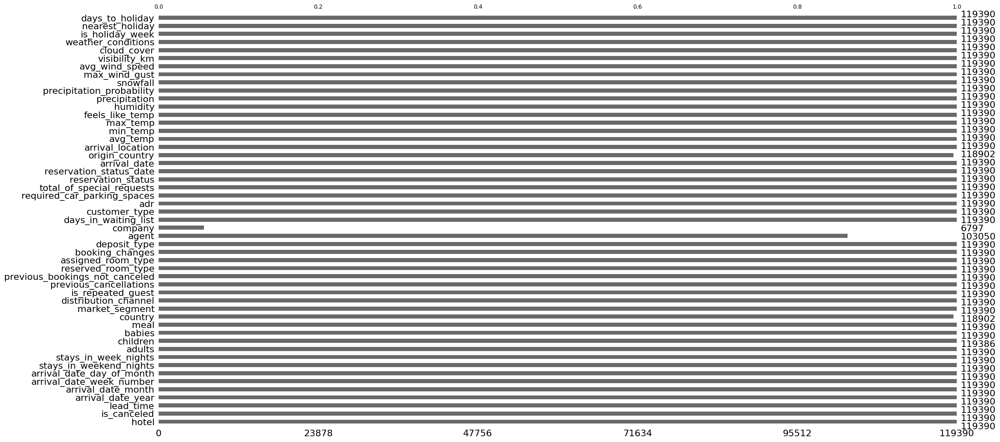

In [ ]:
import missingno as msno

# visualizing null values
msno.bar(final_hotel_bookings_df)
plt.show()

**Dropping Duplicates**

In [ ]:
final_hotel_bookings_df[final_hotel_bookings_df.duplicated()]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
5,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
22,Resort Hotel,0,72,2015,July,27,1,2,4,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
43,Resort Hotel,0,70,2015,July,27,2,2,3,2,...,0,0,39.6,25.5,12.0,2.0,Clear,True,Madeira Day,1
138,Resort Hotel,1,5,2015,July,28,5,1,0,2,...,0,0,37.4,21.1,11.9,5.0,Clear,True,Madeira Day,4
200,Resort Hotel,0,0,2015,July,28,7,0,1,1,...,0,0,36.4,20.2,11.7,10.2,Clear,True,Madeira Day,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119349,City Hotel,0,186,2017,August,35,31,0,3,2,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
119352,City Hotel,0,63,2017,August,35,31,0,3,3,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
119353,City Hotel,0,63,2017,August,35,31,0,3,3,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
119354,City Hotel,0,63,2017,August,35,31,0,3,3,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16


In [ ]:
final_hotel_bookings_df.duplicated().sum()

31994

In [ ]:
final_hotel_bookings_df = final_hotel_bookings_df.drop_duplicates()

In [ ]:
final_hotel_bookings_df.duplicated().sum()

0

**Dropping Columns**

In [ ]:
final_hotel_bookings_df.columns.values

array(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'arrival_date',
       'origin_country', 'arrival_location', 'avg_temp', 'min_temp',
       'max_temp', 'feels_like_temp', 'humidity', 'precipitation',
       'precipitation_probability', 'snowfall', 'max_wind_gust',
       'avg_wind_speed', 'visibility_km', 'cloud_cover',
       'weather_conditions', 'i

In [ ]:
final_hotel_bookings_df.drop('company',inplace=True,axis=1)
# final_hotel_bookings_df.drop('arrival_date_week_number',inplace=True,axis=1)
# final_hotel_bookings_df.drop('arrival_date_year',inplace=True,axis=1)
# final_hotel_bookings_df.drop('arrival_date_month',inplace=True,axis=1)
# final_hotel_bookings_df.drop('arrival_date_day_of_month',inplace=True,axis=1)

<ipython-input-16-d8f2d49b1254>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_hotel_bookings_df.drop('company',inplace=True,axis=1)


In [ ]:
final_hotel_bookings_df.drop('origin_country',inplace=True,axis=1)

<ipython-input-17-37bef889331b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_hotel_bookings_df.drop('origin_country',inplace=True,axis=1)


In [ ]:
final_hotel_bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 87396 entries, 0 to 119389
Data columns (total 49 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           87396 non-null  object 
 1   is_canceled                     87396 non-null  int64  
 2   lead_time                       87396 non-null  int64  
 3   arrival_date_year               87396 non-null  int64  
 4   arrival_date_month              87396 non-null  object 
 5   arrival_date_week_number        87396 non-null  int64  
 6   arrival_date_day_of_month       87396 non-null  int64  
 7   stays_in_weekend_nights         87396 non-null  int64  
 8   stays_in_week_nights            87396 non-null  int64  
 9   adults                          87396 non-null  int64  
 10  children                        87392 non-null  float64
 11  babies                          87396 non-null  int64  
 12  meal                            8739

**Handling Missing Values**

In [ ]:
final_hotel_bookings_df['children'] = final_hotel_bookings_df['children'].fillna(final_hotel_bookings_df['children'].median())
final_hotel_bookings_df['agent'] = final_hotel_bookings_df['agent'].fillna(final_hotel_bookings_df['agent'].median())

<ipython-input-19-9a00276c30b7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_hotel_bookings_df['children'] = final_hotel_bookings_df['children'].fillna(final_hotel_bookings_df['children'].median())
<ipython-input-19-9a00276c30b7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_hotel_bookings_df['agent'] = final_hotel_bookings_df['agent'].fillna(final_hotel_bookings_df['agent'].median())


In [ ]:
# find which country is more frequent in our data
print(final_hotel_bookings_df['country'].mode())


0    PRT
Name: country, dtype: object


In [ ]:
final_hotel_bookings_df['country'].fillna(final_hotel_bookings_df['country'].mode()[0], inplace=True)

<ipython-input-21-78b48c7fcc05>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  final_hotel_bookings_df['country'].fillna(final_hotel_bookings_df['country'].mode()[0], inplace=True)
<ipython-input-21-78b48c7fcc05>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_hotel_bookings_df['country'].fillna(final_hotel_bookings_df['country'].mode

In [ ]:
null_counts = final_hotel_bookings_df.isnull().sum().reset_index()
null_counts.columns = ['Column', 'MissingValues']
null_counts

,Column,MissingValues
0,hotel,0
1,is_canceled,0
2,lead_time,0
3,arrival_date_year,0
4,arrival_date_month,0
5,arrival_date_week_number,0
6,arrival_date_day_of_month,0
7,stays_in_weekend_nights,0
8,stays_in_week_nights,0
9,adults,0


**Check for Miswritings**

In [ ]:
df_cleaned = pd.DataFrame(final_hotel_bookings_df, columns=["hotel",  "country", "market_segment", "distribution_channel", "reserved_room_type", "assigned_room_type", "deposit_type", "customer_type", "reservation_status"])
for col in df_cleaned:
   print(col, df_cleaned[col].unique())

hotel ['Resort Hotel' 'City Hotel']
country ['PRT' 'GBR' 'USA' 'ESP' 'IRL' 'FRA' 'ROU' 'NOR' 'OMN' 'ARG' 'POL' 'DEU'
 'BEL' 'CHE' 'CN' 'GRC' 'ITA' 'NLD' 'DNK' 'RUS' 'SWE' 'AUS' 'EST' 'CZE'
 'BRA' 'FIN' 'MOZ' 'BWA' 'LUX' 'SVN' 'ALB' 'IND' 'CHN' 'MEX' 'MAR' 'UKR'
 'SMR' 'LVA' 'PRI' 'SRB' 'CHL' 'AUT' 'BLR' 'LTU' 'TUR' 'ZAF' 'AGO' 'ISR'
 'CYM' 'ZMB' 'CPV' 'ZWE' 'DZA' 'KOR' 'CRI' 'HUN' 'ARE' 'TUN' 'JAM' 'HRV'
 'HKG' 'IRN' 'GEO' 'AND' 'GIB' 'URY' 'JEY' 'CAF' 'CYP' 'COL' 'GGY' 'KWT'
 'NGA' 'MDV' 'VEN' 'SVK' 'FJI' 'KAZ' 'PAK' 'IDN' 'LBN' 'PHL' 'SEN' 'SYC'
 'AZE' 'BHR' 'NZL' 'THA' 'DOM' 'MKD' 'MYS' 'ARM' 'JPN' 'LKA' 'CUB' 'CMR'
 'BIH' 'MUS' 'COM' 'SUR' 'UGA' 'BGR' 'CIV' 'JOR' 'SYR' 'SGP' 'BDI' 'SAU'
 'VNM' 'PLW' 'QAT' 'EGY' 'PER' 'MLT' 'MWI' 'ECU' 'MDG' 'ISL' 'UZB' 'NPL'
 'BHS' 'MAC' 'TGO' 'TWN' 'DJI' 'STP' 'KNA' 'ETH' 'IRQ' 'HND' 'RWA' 'KHM'
 'MCO' 'BGD' 'IMN' 'TJK' 'NIC' 'BEN' 'VGB' 'TZA' 'GAB' 'GHA' 'TMP' 'GLP'
 'KEN' 'LIE' 'GNB' 'MNE' 'UMI' 'MYT' 'FRO' 'MMR' 'PAN' 'BFA' 'LBY' 'MLI'
 'NAM' '

**Drop Rows with logical errors**

In [ ]:
count_0 = final_hotel_bookings_df[(final_hotel_bookings_df.children == 0) & (final_hotel_bookings_df.adults == 0) & (final_hotel_bookings_df.babies == 0)].shape[0]
count_0

166

In [ ]:
logic_error = final_hotel_bookings_df[(final_hotel_bookings_df['children'] == 0) & (final_hotel_bookings_df['adults'] == 0) & (final_hotel_bookings_df['babies'] == 0)].index
final_hotel_bookings_df.drop(logic_error , inplace=True)

final_hotel_bookings_df.reset_index(drop=True, inplace=True)
final_hotel_bookings_df.head()

<ipython-input-25-5e1f09657feb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_hotel_bookings_df.drop(logic_error , inplace=True)


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0


In [ ]:
count_0 = final_hotel_bookings_df[(final_hotel_bookings_df.children == 0) & (final_hotel_bookings_df.adults == 0) & (final_hotel_bookings_df.babies == 0)].shape[0]
count_0

0

**Save the Cleaned Dataset**

In [ ]:
# final_hotel_bookings_df.to_csv('final_hotel_bookings_df_cleaned.csv', index=False)

In [ ]:
final_hotel_bookings_df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87225,City Hotel,0,23,2017,August,35,30,2,5,2,...,0,0,45.7,24.1,11.0,30.2,Partially cloudy,False,Assumption Day,15
87226,City Hotel,0,102,2017,August,35,31,2,5,3,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
87227,City Hotel,0,34,2017,August,35,31,2,5,2,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
87228,City Hotel,0,109,2017,August,35,31,2,5,2,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16


In [ ]:
final_hotel_bookings_df = pd.read_csv('final_hotel_bookings_df_cleaned.csv')

In [ ]:

final_hotel_bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87230 entries, 0 to 87229
Data columns (total 49 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           87230 non-null  object 
 1   is_canceled                     87230 non-null  int64  
 2   lead_time                       87230 non-null  int64  
 3   arrival_date_year               87230 non-null  int64  
 4   arrival_date_month              87230 non-null  object 
 5   arrival_date_week_number        87230 non-null  int64  
 6   arrival_date_day_of_month       87230 non-null  int64  
 7   stays_in_weekend_nights         87230 non-null  int64  
 8   stays_in_week_nights            87230 non-null  int64  
 9   adults                          87230 non-null  int64  
 10  children                        87230 non-null  float64
 11  babies                          87230 non-null  int64  
 12  meal                            

## **EDA**

**What are the main countries or regions guests travel from?**

In [ ]:
# get number of acutal guests by country
country_data = pd.DataFrame(final_hotel_bookings_df.loc[final_hotel_bookings_df["is_canceled"] == 0]["country"].value_counts().reset_index())
country_data.columns = ["country", "Number of Guests"]
#country_data.set_index("country", inplace=True
#country_data.index.name = "country"
#country_data.rename(columns={"country": "Number of Guests"}, inplace=True)


In [ ]:
country_data

,country,Number of Guests
0,PRT,17991
1,GBR,8440
2,FRA,7091
3,ESP,5382
4,DEU,4332
...,...,...
160,ZMB,1
161,SYC,1
162,MDG,1
163,SMR,1


In [ ]:
total_guests = country_data["Number of Guests"].sum()
country_data["Guests in %"] = round(country_data["Number of Guests"] / total_guests * 100, 2)
# country_data["country"] = country_data.index
#country_data.loc[country_data["Guests in %"] < 2, "country"] = "Other"

# pie plot
fig = px.pie(country_data,
             values="Number of Guests",
             names="country",
             title="Home country of guests",
             template="seaborn")
fig.update_traces(textposition="inside", textinfo="value+percent+label")
fig.show()

In [ ]:
# show on map
guest_map = px.choropleth(country_data,
                    locations=country_data['country'],
                    color=country_data["Guests in %"],
                    hover_name=country_data['country'],
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Home country of guests")
guest_map.show()

**How much do guests pay for a room per night?**

In [ ]:
data = final_hotel_bookings_df[final_hotel_bookings_df['is_canceled'] == 0]

px.box(data_frame = data, x = 'reserved_room_type', y = 'adr', color = 'hotel', title = 'ADR per room night',template = 'plotly_dark')

**How does the price vary per night over the year?**

In [ ]:
data_resort = final_hotel_bookings_df[(final_hotel_bookings_df['hotel'] == 'Resort Hotel') & (final_hotel_bookings_df['is_canceled'] == 0)]
data_city = final_hotel_bookings_df[(final_hotel_bookings_df['hotel'] == 'City Hotel') & (final_hotel_bookings_df['is_canceled'] == 0)]

In [ ]:
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
resort_hotel

,arrival_date_month,adr
0,April,76.841664
1,August,182.103524
2,December,64.072826
3,February,53.624311
4,January,48.599615
5,July,150.914540
6,June,109.026942
7,March,57.110018
8,May,77.725129
9,November,48.956548


In [ ]:
city_hotel=data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel

,arrival_date_month,adr
0,April,114.251636
1,August,122.825388
2,December,90.769559
3,February,88.210810
4,January,83.378062
5,July,120.069489
6,June,120.673753
7,March,91.306933
8,May,124.825944
9,November,88.271089


In [ ]:
final_hotel = resort_hotel.merge(city_hotel, on = 'arrival_date_month')
final_hotel.columns = ['month', 'price_for_resort', 'price_for_city_hotel']
final_hotel

,month,price_for_resort,price_for_city_hotel
0,April,76.841664,114.251636
1,August,182.103524,122.825388
2,December,64.072826,90.769559
3,February,53.624311,88.210810
4,January,48.599615,83.378062
5,July,150.914540,120.069489
6,June,109.026942,120.673753
7,March,57.110018,91.306933
8,May,77.725129,124.825944
9,November,48.956548,88.271089


In [ ]:
!pip install sort-dataframeby-monthorweek

!pip install sorted-months-weekdays

  Preparing metadata (setup.py) ... done
  Created wheel for sort-dataframeby-monthorweek: filename=sort_dataframeby_monthorweek-0.4-py3-none-any.whl size=3421 sha256=218ac325350f50bdce289496fbd47a6b9c24cb8cd1ec289208a6a5ccd60c0858
  Stored in directory: /root/.cache/pip/wheels/ac/4c/ca/134c7282a08e7e2b149b1da1975c6686a262c15a92b78adcc7
Successfully built sort-dataframeby-monthorweek
  Preparing metadata (setup.py) ... done
  Created wheel for sorted-months-weekdays: filename=sorted_months_weekdays-0.2-py3-none-any.whl size=3225 sha256=bee847739d372e5ca1fca4d4236efe374053a7bc2a48b2e9ef8f756ac415fb2a
  Stored in directory: /root/.cache/pip/wheels/4d/4f/f5/d9e3e3e60d80b3cdc2f69dfcf0d4bc45257abdea94f2035dbb
Successfully built sorted-months-weekdays


In [ ]:
import sort_dataframeby_monthorweek as sd

def sort_month(df, column_name):
    return sd.Sort_Dataframeby_Month(df, column_name)

In [ ]:
final_prices = sort_month(final_hotel, 'month')
final_prices

,month,price_for_resort,price_for_city_hotel
0,January,48.599615,83.378062
1,February,53.624311,88.210810
2,March,57.110018,91.306933
3,April,76.841664,114.251636
4,May,77.725129,124.825944
5,June,109.026942,120.673753
6,July,150.914540,120.069489
7,August,182.103524,122.825388
8,September,98.855456,116.973279
9,October,62.634853,105.517410


In [ ]:
plt.figure(figsize = (17, 8))

px.line(final_prices, x = 'month', y = ['price_for_resort','price_for_city_hotel'],
        title = 'Room price per night over the Months', template = 'plotly_dark')

<Figure size 1700x800 with 0 Axes>

**Reservation status in different hotels**

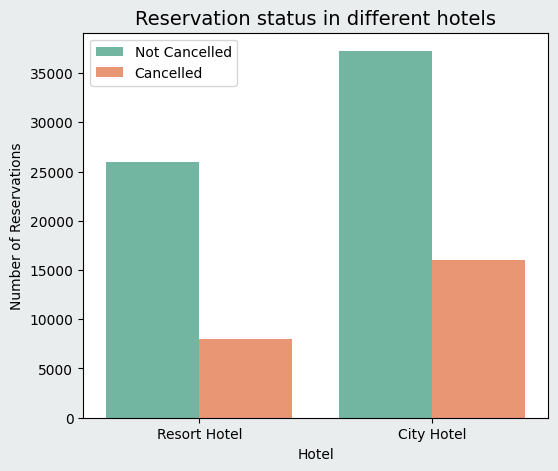

In [ ]:
# Set the background color of the figure
plt.figure(figsize=(6, 5), facecolor='#EAEDED')

# Create the countplot
ax1 = sns.countplot(x='hotel', hue='is_canceled', data=final_hotel_bookings_df, palette="Set2")

# Customize legend location
legend_labels, _ = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1, 1))

# Set plot title and axis labels
plt.title('Reservation status in different hotels', size=14, color='Black')
plt.xlabel('Hotel',color='Black')
plt.ylabel('Number of Reservations', color='Black')

# Customize legend labels
plt.legend(['Not Cancelled', 'Cancelled'])

# Show the plot
plt.show()

**Arriving year, Leadtime and Cancelations**

In [ ]:
final_hotel_bookings_df.columns.values

array(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'arrival_date',
       'arrival_location', 'avg_temp', 'min_temp', 'max_temp',
       'feels_like_temp', 'humidity', 'precipitation',
       'precipitation_probability', 'snowfall', 'max_wind_gust',
       'avg_wind_speed', 'visibility_km', 'cloud_cover',
       'weather_conditions', 'is_holiday_week', 'nearest_hol

Text(0.5, 1.0, 'Arriving year, Leadtime and Cancelations')

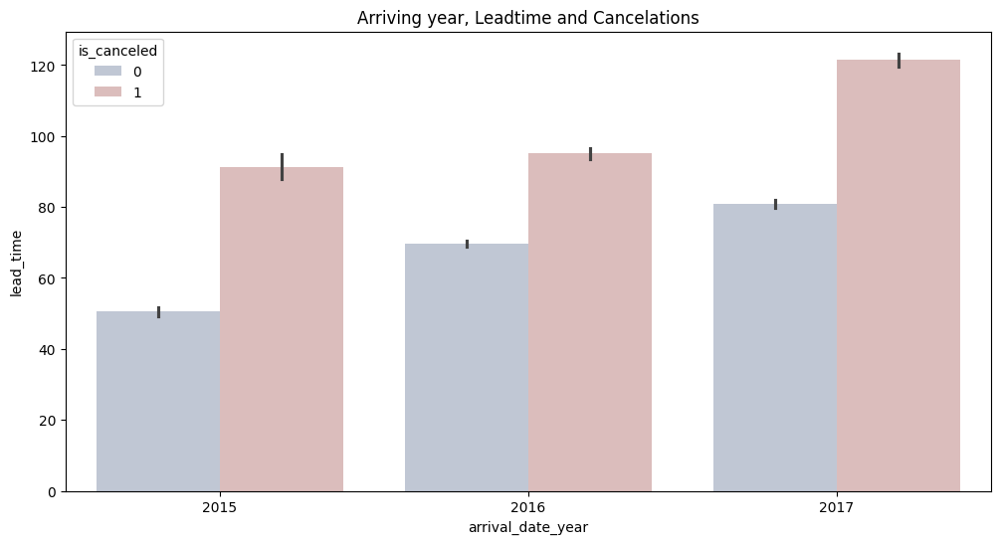

In [ ]:
plt.figure(figsize=(12,6))
sns.barplot(x='arrival_date_year', y='lead_time',hue='is_canceled', data= final_hotel_bookings_df, palette='vlag')
plt.title('Arriving year, Leadtime and Cancelations')

**Which are the most busy months?**

In [ ]:
resort_guests = data_resort['arrival_date_month'].value_counts().reset_index()
resort_guests.columns=['month','no of guests']
resort_guests

,month,no of guests
0,August,3153
1,July,3013
2,May,2246
3,October,2209
4,March,2191
5,April,2169
6,February,2053
7,June,1926
8,September,1875
9,November,1744


In [ ]:
city_guests = data_city['arrival_date_month'].value_counts().reset_index()
city_guests.columns=['month','no of guests']
city_guests

,month,no of guests
0,August,4467
1,July,3834
2,May,3656
3,June,3477
4,March,3469
5,April,3325
6,September,3166
7,October,3070
8,February,2618
9,November,2177


In [ ]:
final_guests = resort_guests.merge(city_guests,on='month')
final_guests.columns=['month','no of guests in resort','no of guest in city hotel']
final_guests

,month,no of guests in resort,no of guest in city hotel
0,August,3153,4467
1,July,3013,3834
2,May,2246,3656
3,October,2209,3070
4,March,2191,3469
5,April,2169,3325
6,February,2053,2618
7,June,1926,3477
8,September,1875,3166
9,November,1744,2177


In [ ]:
final_guests = sort_month(final_guests,'month')
final_guests

,month,no of guests in resort,no of guest in city hotel
0,January,1687,1961
1,February,2053,2618
2,March,2191,3469
3,April,2169,3325
4,May,2246,3656
5,June,1926,3477
6,July,3013,3834
7,August,3153,4467
8,September,1875,3166
9,October,2209,3070


In [ ]:
px.line(final_guests, x = 'month', y = ['no of guests in resort','no of guest in city hotel'],
        title='Total no of guests per Months', template = 'plotly_dark')

**How long do people stay at the hotels?**

In [ ]:
filter = final_hotel_bookings_df['is_canceled'] == 0
data = final_hotel_bookings_df[filter]
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0


In [ ]:
data['total_nights'] = data['stays_in_weekend_nights'] + data['stays_in_week_nights']
data.head()

<ipython-input-55-a6d36badedd5>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday,total_nights
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0,1
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0,1
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0,2


In [ ]:
stay = data.groupby(['total_nights', 'hotel']).agg('count').reset_index()
stay = stay.iloc[:, :3]
stay = stay.rename(columns={'is_canceled':'Number of stays'})
stay

,total_nights,hotel,Number of stays
0,0,City Hotel,218
1,0,Resort Hotel,350
2,1,City Hotel,7972
3,1,Resort Hotel,6036
4,2,City Hotel,7630
...,...,...,...
57,46,Resort Hotel,1
58,48,City Hotel,1
59,56,Resort Hotel,1
60,60,Resort Hotel,1


In [ ]:
px.bar(data_frame = stay, x = 'total_nights', y = 'Number of stays', color = 'hotel', barmode = 'group',title='Total no of stays per nights',
        template = 'plotly_dark')

In [ ]:
final_hotel_bookings_df.columns.values

array(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'arrival_date',
       'arrival_location', 'avg_temp', 'min_temp', 'max_temp',
       'feels_like_temp', 'humidity', 'precipitation',
       'precipitation_probability', 'snowfall', 'max_wind_gust',
       'avg_wind_speed', 'visibility_km', 'cloud_cover',
       'weather_conditions', 'is_holiday_week', 'nearest_hol

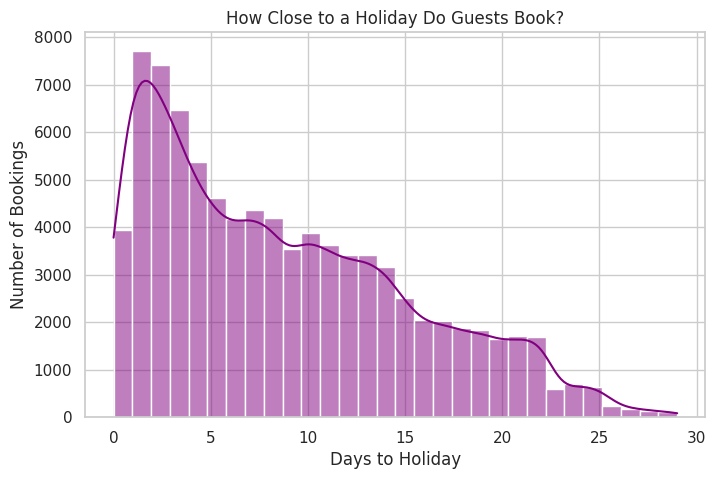

<ipython-input-136-62c577371d33>:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




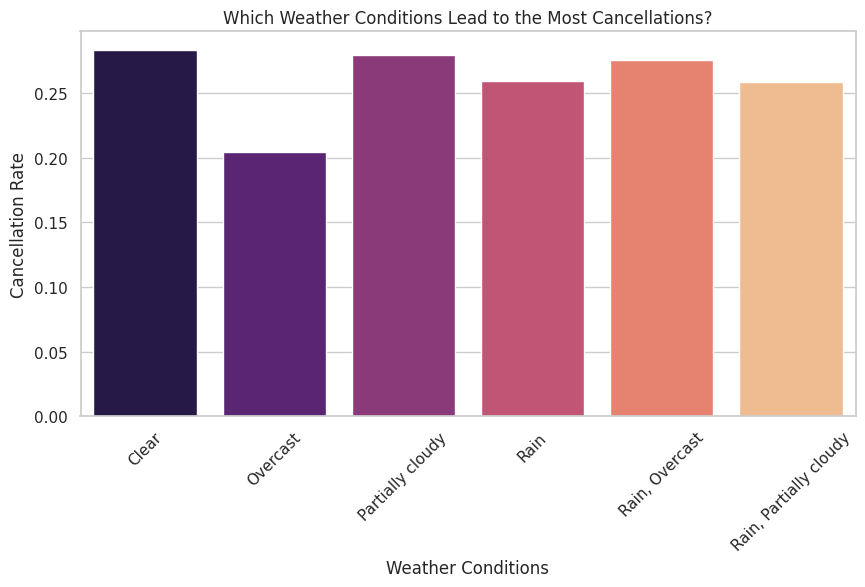

<ipython-input-136-62c577371d33>:46: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


<ipython-input-136-62c577371d33>:46: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




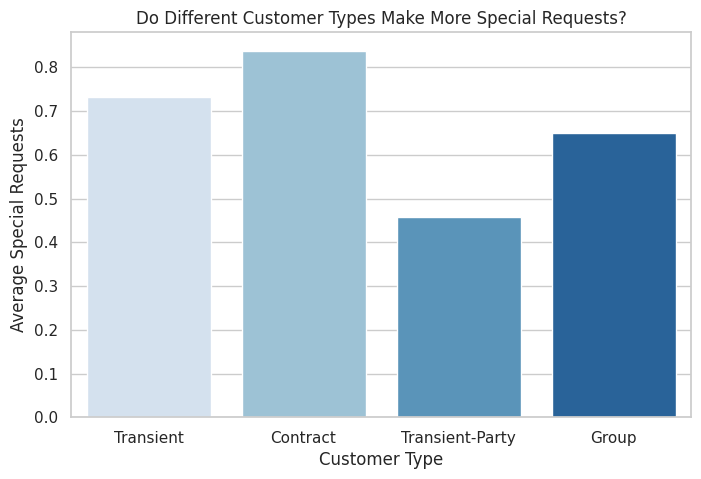

In [ ]:
df = final_hotel_bookings_df.copy()


# Convert dates to datetime format
df['arrival_date'] = pd.to_datetime(df['arrival_date'])

# Set Seaborn style
sns.set(style="whitegrid")

# ---- 1. Seaborn: How Close to a Holiday Do Guests Book? ----
plt.figure(figsize=(8, 5))
sns.histplot(df["days_to_holiday"], bins=30, kde=True, color="purple")
plt.title("How Close to a Holiday Do Guests Book?")
plt.xlabel("Days to Holiday")
plt.ylabel("Number of Bookings")
plt.show()

# ---- 2. Matplotlib: How Does Weather Impact Cancellation Rates? ----
plt.figure(figsize=(10, 5))
weather_cancellation = df.groupby("weather_conditions")["is_canceled"].mean().reset_index()
sns.barplot(x="weather_conditions", y="is_canceled", data=weather_cancellation, palette="magma")
plt.xticks(rotation=45)
plt.title("Which Weather Conditions Lead to the Most Cancellations?")
plt.xlabel("Weather Conditions")
plt.ylabel("Cancellation Rate")
plt.show()

# ---- 3. Plotly: Lead Time Distribution by Market Segment ----
fig3 = px.box(df, x="market_segment", y="lead_time", color="market_segment",
              title="How Far in Advance Do Guests Book? (By Market Segment)",
              labels={'market_segment': "Market Segment", 'lead_time': "Lead Time (Days)"},
              boxmode="group")
fig3.show()

# ---- 4. Plotly: ADR Trends Over Time ----
df["arrival_month_year"] = df["arrival_date"].dt.to_period("M").astype(str)
adr_trend = df.groupby("arrival_month_year")["adr"].mean().reset_index()
fig4 = px.line(adr_trend, x="arrival_month_year", y="adr",
               title="How Does ADR Change Over Time?",
               labels={'arrival_month_year': "Month", 'adr': "Average Daily Rate"},
               markers=True)
fig4.show()

# ---- 5. Seaborn: Impact of Customer Type on Special Requests ----
plt.figure(figsize=(8, 5))
sns.barplot(x="customer_type", y="total_of_special_requests", data=df, palette="Blues", ci=None)
plt.title("Do Different Customer Types Make More Special Requests?")
plt.xlabel("Customer Type")
plt.ylabel("Average Special Requests")
plt.show()


## **PCA**


Principal Component Analysis (PCA) is a dimensionality reduction technique that transforms high-dimensional data into a lower-dimensional space while preserving as much variance as possible. It does this by identifying new axes, called principal components, which are linear combinations of the original variables. The first principal component captures the maximum variance in the data, while each subsequent component captures progressively less variance. PCA is widely used for data visualization, noise reduction, and improving computational efficiency by reducing redundant features while maintaining essential information.

In [ ]:
pca_df = pd.read_csv('final_hotel_bookings_df_cleaned.csv')

In [ ]:
pca_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87230 entries, 0 to 87229
Data columns (total 49 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           87230 non-null  object 
 1   is_canceled                     87230 non-null  int64  
 2   lead_time                       87230 non-null  int64  
 3   arrival_date_year               87230 non-null  int64  
 4   arrival_date_month              87230 non-null  object 
 5   arrival_date_week_number        87230 non-null  int64  
 6   arrival_date_day_of_month       87230 non-null  int64  
 7   stays_in_weekend_nights         87230 non-null  int64  
 8   stays_in_week_nights            87230 non-null  int64  
 9   adults                          87230 non-null  int64  
 10  children                        87230 non-null  float64
 11  babies                          87230 non-null  int64  
 12  meal                            

In [ ]:
pca_df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
# Identify and remove categorical columns
categorical_columns = pca_df.select_dtypes(include=['object', 'bool']).columns

# Identify categorical-encoded labels to remove
categorical_encoded_columns = ['is_canceled', 'is_repeated_guest', 'arrival_date_year']

# Remove categorical and categorical-encoded columns
df_pca_ready = pca_df.drop(columns=list(categorical_columns) + categorical_encoded_columns, axis=1)

# Normalize the numerical data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_pca_ready)

# Convert back to DataFrame for readability
df_scaled = pd.DataFrame(df_scaled, columns=df_pca_ready.columns)

df_scaled


,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,...,feels_like_temp,humidity,precipitation,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,days_to_holiday
0,3.044788,0.012064,-1.676854,-0.977814,-1.286352,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
1,7.634706,0.012064,-1.676854,-0.977814,-1.286352,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
2,-0.847926,0.012064,-1.676854,-0.977814,-0.796113,-1.414406,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
3,-0.778206,0.012064,-1.676854,-0.977814,-0.796113,-1.414406,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
4,-0.766586,0.012064,-1.676854,-0.977814,-0.305873,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87225,-0.662006,0.597324,1.605362,0.968843,1.164846,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.940915,-0.279184,-0.572682,0.0,0.429844,-0.055470,-0.233596,-0.184332,0.943150
87226,0.255978,0.597324,1.718542,0.968843,1.164846,1.802474,-0.304424,-0.095379,-0.082315,-0.106204,...,0.581216,0.669734,-0.279184,-0.572682,0.0,0.564000,0.941709,0.686963,-0.518044,1.092948
87227,-0.534185,0.597324,1.718542,0.968843,1.164846,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.581216,0.669734,-0.279184,-0.572682,0.0,0.564000,0.941709,0.686963,-0.518044,1.092948
87228,0.337318,0.597324,1.718542,0.968843,1.164846,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.581216,0.669734,-0.279184,-0.572682,0.0,0.564000,0.941709,0.686963,-0.518044,1.092948


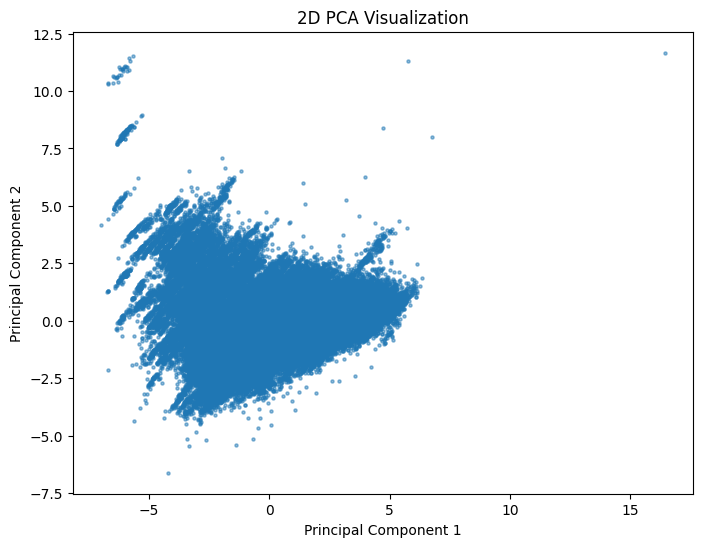

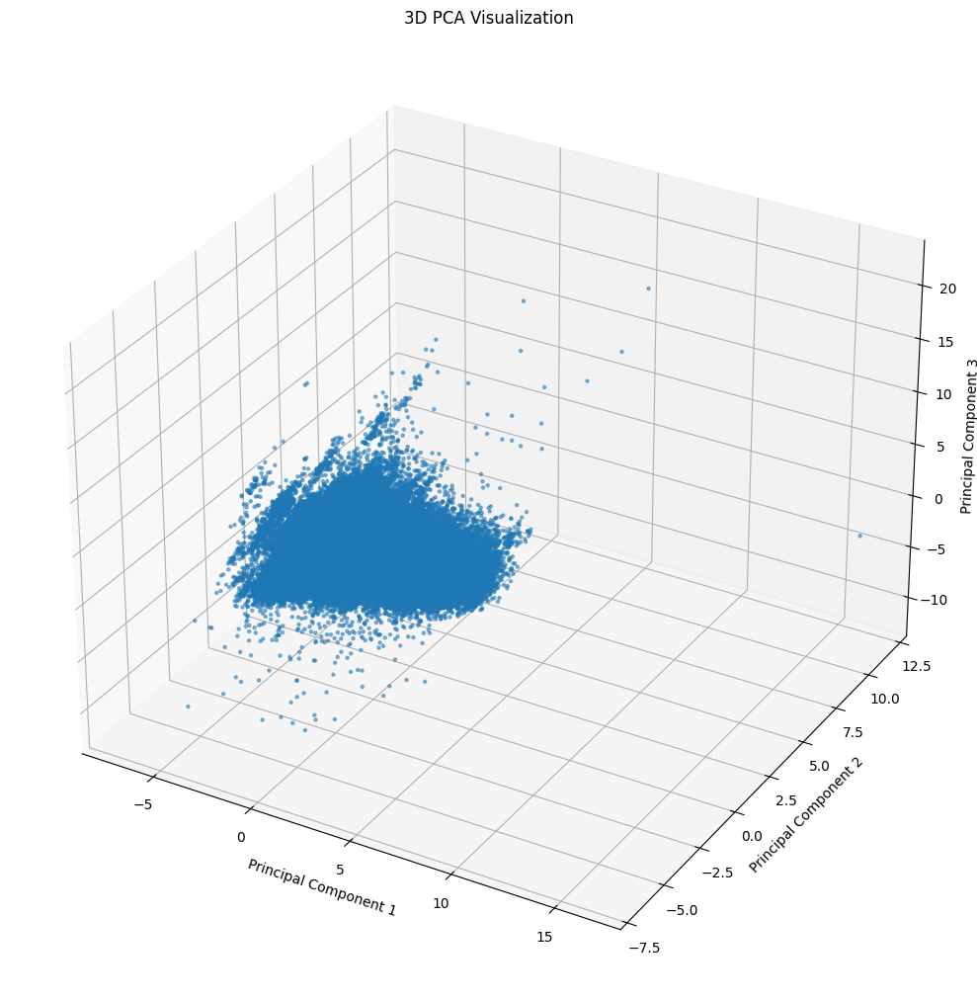

(27.389673279458243, 33.77155981006329)

In [ ]:
# Perform PCA with n_components=2
pca_2d = PCA(n_components=2)
pca_2d_result = pca_2d.fit_transform(df_scaled)

# Perform PCA with n_components=3
pca_3d = PCA(n_components=3)
pca_3d_result = pca_3d.fit_transform(df_scaled)

# Variance explained by the first 2 and 3 principal components
variance_2d = np.sum(pca_2d.explained_variance_ratio_) * 100
variance_3d = np.sum(pca_3d.explained_variance_ratio_) * 100

# Visualizing the 2D PCA result
plt.figure(figsize=(8, 6))
plt.scatter(pca_2d_result[:, 0], pca_2d_result[:, 1], alpha=0.5, s=5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Visualization')
plt.show()

# Visualizing the 3D PCA result
fig = plt.figure(figsize=(10, 12))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_3d_result[:, 0], pca_3d_result[:, 1], pca_3d_result[:, 2], alpha=0.5, s=5)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA Visualization')
plt.tight_layout()
plt.show()


# Display the variance retained in 2D and 3D
variance_2d, variance_3d


The variance retained in the PCA transformation is:

* 2D PCA: ~27.39% of the variance.

* 3D PCA: ~33.77% of the variance.




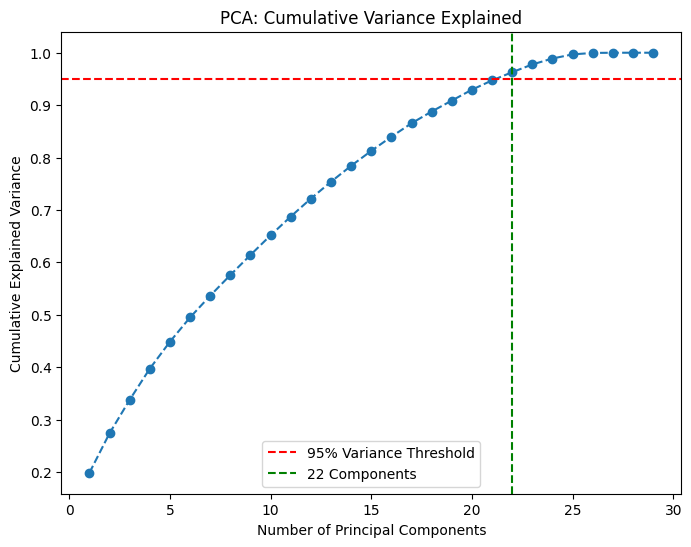

(22, array([5.55650341, 2.11269302, 1.78694871]))

In [ ]:
# Perform PCA on the full dataset to check cumulative variance
pca_full = PCA()
pca_full.fit(df_scaled)

# Calculate cumulative variance
cumulative_variance = np.cumsum(pca_full.explained_variance_ratio_)

# Find the number of components needed to retain at least 95% variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1

# Plot cumulative variance
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance Threshold')
plt.axvline(x=n_components_95, color='g', linestyle='--', label=f'{n_components_95} Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA: Cumulative Variance Explained')
plt.legend()
plt.show()

# Extract the top three eigenvalues
top_three_eigenvalues = pca_full.explained_variance_[:3]

# Display the number of components needed and top three eigenvalues
n_components_95, top_three_eigenvalues


#### **Final Results of PCA Analysis:**

To retain at least 95% variance, 22 principal components are required.

**Top three eigenvalues:**

* 5.5565
* 2.1127
* 1.7869

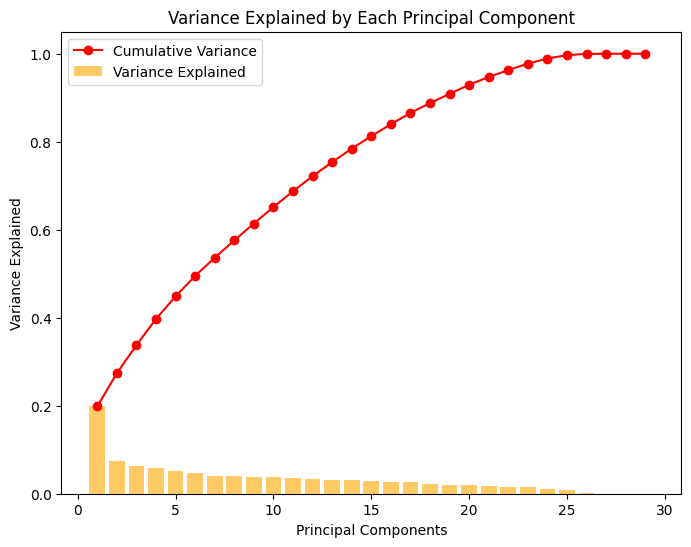

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Assuming df_scaled is the standardized dataset
pca = PCA()
pca.fit(df_scaled)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot the variance explained and cumulative variance
plt.figure(figsize=(8, 6))

# Bar plot for individual variance explained by each component
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.6, color='orange', label='Variance Explained')

# Line plot for cumulative variance
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', color='red', linestyle='-', label='Cumulative Variance')

plt.xlabel('Principal Components')
plt.ylabel('Variance Explained')
plt.title('Variance Explained by Each Principal Component')
plt.legend()
plt.show()


In [ ]:
# Creating DataFrames
df_pca_2d = pd.DataFrame(pca_2d_result, columns=['PC1', 'PC2'])
df_pca_3d = pd.DataFrame(pca_3d_result, columns=['PC1', 'PC2', 'PC3'])

In [ ]:
df_pca_2d

,PC1,PC2
0,0.414679,1.556572
1,1.042350,2.151985
2,0.046534,1.086262
3,0.287924,1.098551
4,0.522028,1.458659
...,...,...
87225,1.071810,0.387851
87226,1.943175,1.393421
87227,1.587344,1.037849
87228,1.390512,0.794931


In [ ]:
df_pca_3d

,PC1,PC2,PC3
0,0.414679,1.556572,-0.543178
1,1.042350,2.151985,1.098192
2,0.046534,1.086262,-2.315316
3,0.287924,1.098551,-1.780846
4,0.522028,1.458659,-1.302956
...,...,...,...
87225,1.071810,0.387851,1.259553
87226,1.943175,1.393421,0.661739
87227,1.587344,1.037849,0.343549
87228,1.390512,0.794931,0.459801


## **Clustering**

Variance retained after PCA (3 components): 33.77%


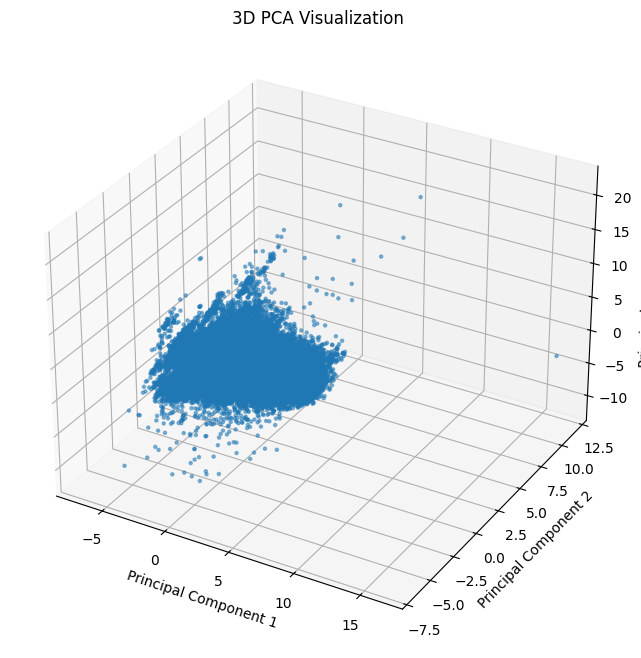

In [ ]:
cluster_df = pd.read_csv('final_hotel_bookings_df_cleaned.csv')

# Step 1: Choose a labeled dataset for clustering
label_column = "is_canceled"
labels = cluster_df[label_column]  # Store labels separately

# Step 2: Remove categorical columns
categorical_columns = cluster_df.select_dtypes(include=['object', 'bool']).columns
categorical_encoded_columns = ['is_canceled', 'is_repeated_guest', 'arrival_date_year']
df_clustering_ready = cluster_df.drop(columns=list(categorical_columns) + categorical_encoded_columns, axis=1)

# Step 3: Normalize the numerical data using StandardScaler
scaler = StandardScaler()
cluster_df_scaled = scaler.fit_transform(df_clustering_ready)
cluster_df_scaled = pd.DataFrame(cluster_df_scaled, columns=df_clustering_ready.columns)

# Step 4: Perform PCA (Optional) to Reduce to 3D
pca_3d = PCA(n_components=3)
pca_3d_result = pca_3d.fit_transform(cluster_df_scaled)

# Variance explained by the first 3 principal components
variance_3d = np.sum(pca_3d.explained_variance_ratio_) * 100
print(f"Variance retained after PCA (3 components): {variance_3d:.2f}%")

# Step 5: 3D Scatter Plot of PCA-Reduced Data
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_3d_result[:, 0], pca_3d_result[:, 1], pca_3d_result[:, 2], alpha=0.5, s=5)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA Visualization')
plt.show()

In [ ]:
cluster_df_scaled

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,...,feels_like_temp,humidity,precipitation,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,days_to_holiday
0,3.044788,0.012064,-1.676854,-0.977814,-1.286352,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
1,7.634706,0.012064,-1.676854,-0.977814,-1.286352,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
2,-0.847926,0.012064,-1.676854,-0.977814,-0.796113,-1.414406,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
3,-0.778206,0.012064,-1.676854,-0.977814,-0.796113,-1.414406,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
4,-0.766586,0.012064,-1.676854,-0.977814,-0.305873,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.354578,-0.279184,-0.572682,0.0,1.172175,1.995870,-0.233596,0.040924,-1.303823
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87225,-0.662006,0.597324,1.605362,0.968843,1.164846,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.502384,0.940915,-0.279184,-0.572682,0.0,0.429844,-0.055470,-0.233596,-0.184332,0.943150
87226,0.255978,0.597324,1.718542,0.968843,1.164846,1.802474,-0.304424,-0.095379,-0.082315,-0.106204,...,0.581216,0.669734,-0.279184,-0.572682,0.0,0.564000,0.941709,0.686963,-0.518044,1.092948
87227,-0.534185,0.597324,1.718542,0.968843,1.164846,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.581216,0.669734,-0.279184,-0.572682,0.0,0.564000,0.941709,0.686963,-0.518044,1.092948
87228,0.337318,0.597324,1.718542,0.968843,1.164846,0.194034,-0.304424,-0.095379,-0.082315,-0.106204,...,0.581216,0.669734,-0.279184,-0.572682,0.0,0.564000,0.941709,0.686963,-0.518044,1.092948


In [ ]:
df_pca_3d = pd.DataFrame(pca_3d_result, columns=['PC1', 'PC2', 'PC3'])

df_pca_3d

,PC1,PC2,PC3
0,0.414679,1.556572,-0.543178
1,1.042350,2.151985,1.098192
2,0.046534,1.086262,-2.315316
3,0.287924,1.098551,-1.780846
4,0.522028,1.458659,-1.302956
...,...,...,...
87225,1.071810,0.387851,1.259553
87226,1.943175,1.393421,0.661739
87227,1.587344,1.037849,0.343549
87228,1.390512,0.794931,0.459801


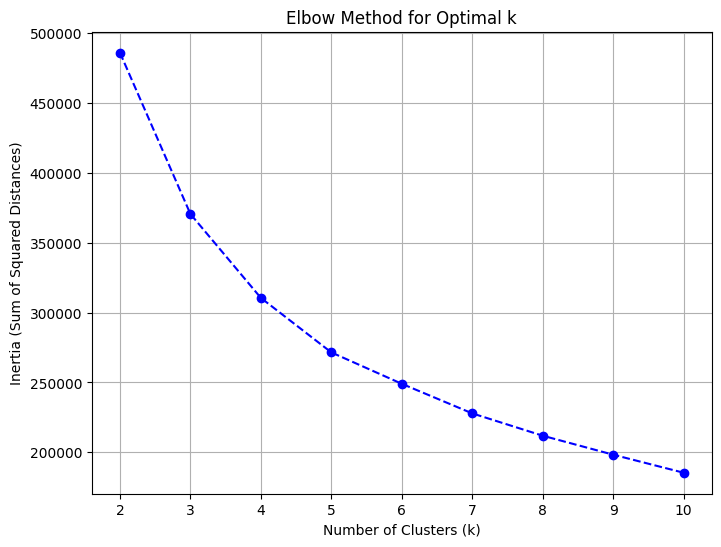

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans

# Step 1: Define k values to test
k_values = range(2, 11)  # Checking k from 2 to 10
inertia_scores = []

# Step 2: Run KMeans for each k and record inertia (within-cluster sum of squares)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_3d_result)
    inertia_scores.append(kmeans.inertia_)

# Step 3: Plot Elbow Method Graph
plt.figure(figsize=(8, 6))
plt.plot(k_values, inertia_scores, marker='o', linestyle='--', color='b')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (Sum of Squared Distances)')
plt.title('Elbow Method for Optimal k')
plt.xticks(k_values)
plt.grid(True)
plt.show()


2
3
4
5
6
7
8


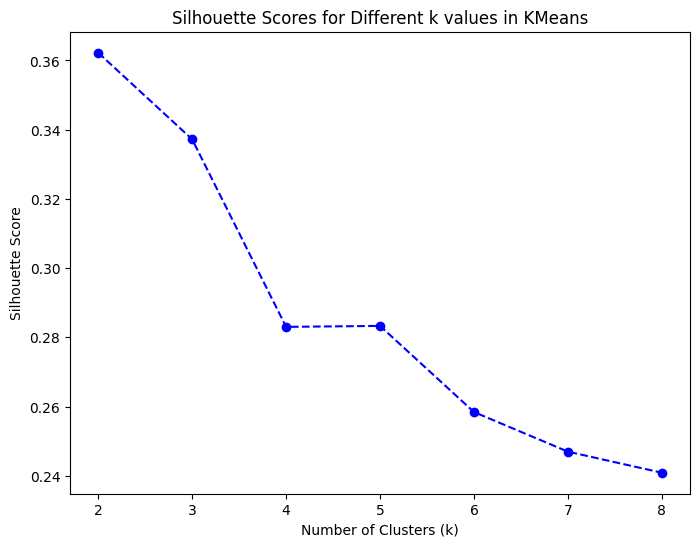

Top 3 optimal k values: [(2, 0.3622199802632861), (3, 0.3372042583219833), (5, 0.28331292751102227)]


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Compute silhouette scores to find the best k
k_values = [2, 3, 4, 5, 6, 7, 8]
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    cluster_labels = kmeans.fit_predict(pca_3d_result)

    # Compute silhouette score
    print(k)
    score = silhouette_score(pca_3d_result, cluster_labels)
    silhouette_scores.append(score)

# Step 2: Plot Silhouette Scores
plt.figure(figsize=(8, 6))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='--', color='b')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Different k values in KMeans')
plt.show()

# Step 3: Select the best 3 k values
optimal_k_values = sorted(zip(k_values, silhouette_scores), key=lambda x: x[1], reverse=True)[:3]
print("Top 3 optimal k values:", optimal_k_values)


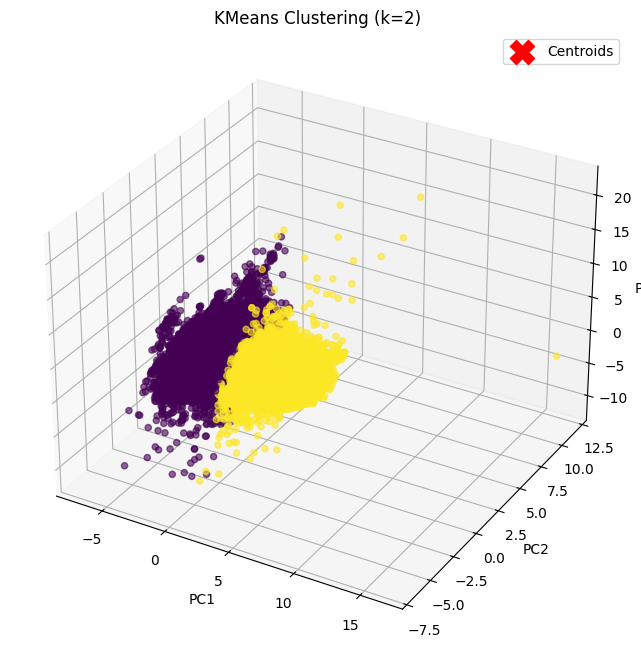

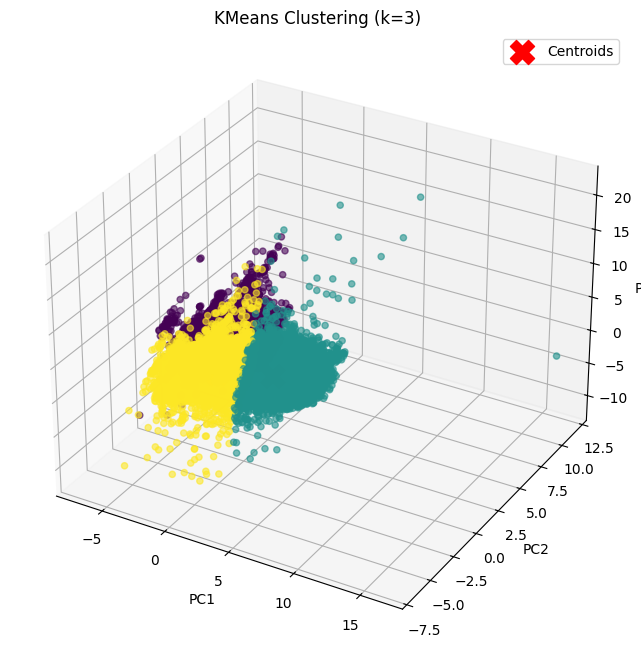

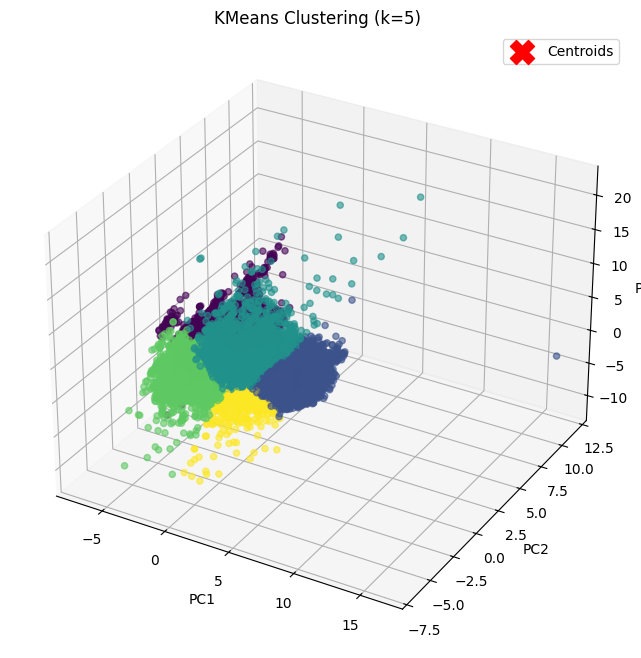

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Plot clusters for the top 3 k values
for k, _ in optimal_k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=200)
    cluster_labels = kmeans.fit_predict(pca_3d_result)
    centroids = kmeans.cluster_centers_

    # 3D Visualization
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(pca_3d_result[:, 0], pca_3d_result[:, 1], pca_3d_result[:, 2], c=cluster_labels, cmap='viridis', alpha=0.6)

    # Plot centroids
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], marker='X', s=300, c='red', label='Centroids')

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title(f'KMeans Clustering (k={k})')
    ax.legend()
    plt.show()


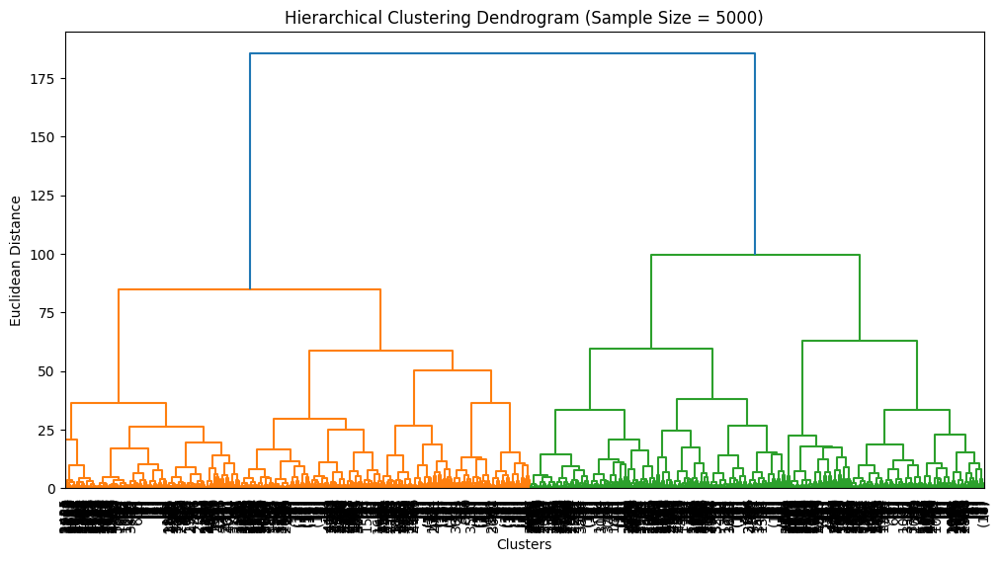

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Randomly sample 5000 points to avoid memory crash
sample_size = 5000
sample_indices = np.random.choice(len(pca_3d_result), size=sample_size, replace=False)
pca_sample = pca_3d_result[sample_indices]

from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Compute hierarchical clustering on sampled data
linked = linkage(pca_sample, method='ward')

# Step 2: Plot a cleaner dendrogram
plt.figure(figsize=(12, 6))

dendrogram(
    linked,
    truncate_mode='level',  # Show only higher-level clusters
    p=10,  # Number of clusters to show
    leaf_rotation=90,  # Rotate labels for readability
    leaf_font_size=10,  # Adjust label size
)

plt.title(f'Hierarchical Clustering Dendrogram (Sample Size = {sample_size})')
plt.xlabel('Clusters')
plt.ylabel('Euclidean Distance')
plt.show()


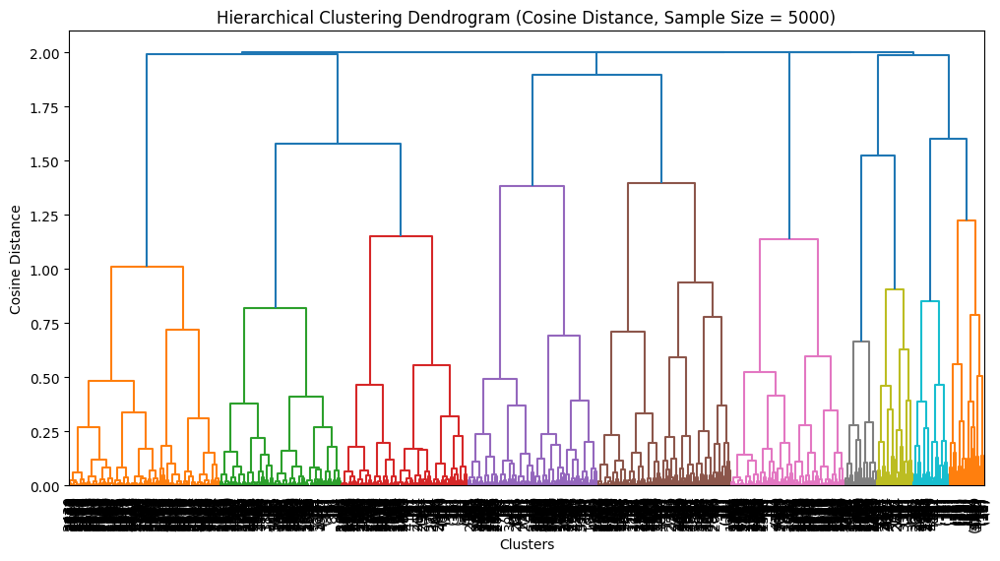

In [ ]:
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Randomly sample 5000 points (to avoid memory crash)
sample_size = 5000
sample_indices = np.random.choice(len(pca_3d_result), size=sample_size, replace=False)
pca_sample = pca_3d_result[sample_indices]

# Step 2: Compute cosine distance matrix
cosine_distances = pdist(pca_sample, metric='cosine')

# Step 3: Compute hierarchical clustering using cosine distance
linked = linkage(cosine_distances, method='complete')  # "complete" works better with cosine

# Step 4: Plot a cleaner dendrogram
plt.figure(figsize=(12, 6))

dendrogram(
    linked,
    truncate_mode='level',  # Show only higher-level clusters
    p=10,  # Show top 10 clusters
    leaf_rotation=90,  # Rotate labels for readability
    leaf_font_size=10,  # Adjust label size
)

plt.title(f'Hierarchical Clustering Dendrogram (Cosine Distance, Sample Size = {sample_size})')
plt.xlabel('Clusters')
plt.ylabel('Cosine Distance')
plt.show()


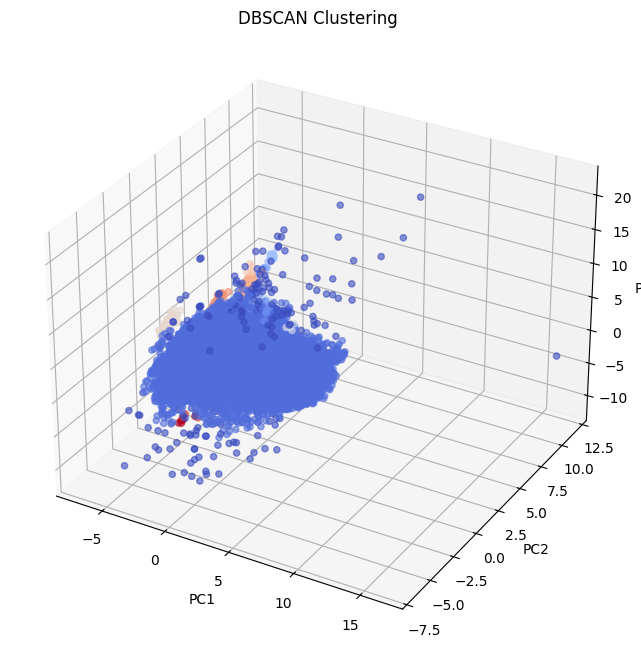

In [ ]:
from sklearn.cluster import DBSCAN

# Step 1: Apply DBSCAN
dbscan = DBSCAN(eps=0.8, min_samples=5)  # Adjust eps based on density
dbscan_labels = dbscan.fit_predict(pca_3d_result)

# Step 2: Visualize DBSCAN Clustering
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(pca_3d_result[:, 0], pca_3d_result[:, 1], pca_3d_result[:, 2], c=dbscan_labels, cmap='coolwarm', alpha=0.6)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('DBSCAN Clustering')
plt.show()


<ipython-input-15-9ec1a03d7bc6>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette="viridis")


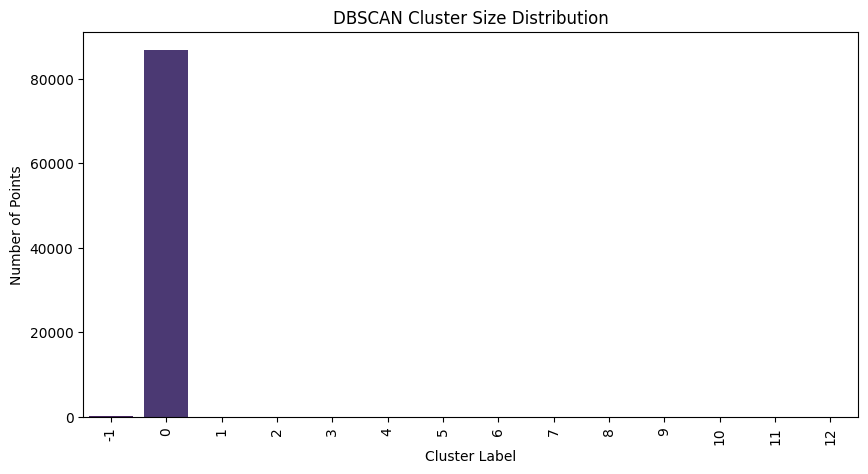

In [ ]:
import seaborn as sns
import pandas as pd

# Step 1: Count points per cluster
cluster_counts = pd.Series(dbscan_labels).value_counts().sort_index()

# Step 2: Plot cluster sizes
plt.figure(figsize=(10, 5))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette="viridis")

plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.title('DBSCAN Cluster Size Distribution')
plt.xticks(rotation=90)
plt.show()


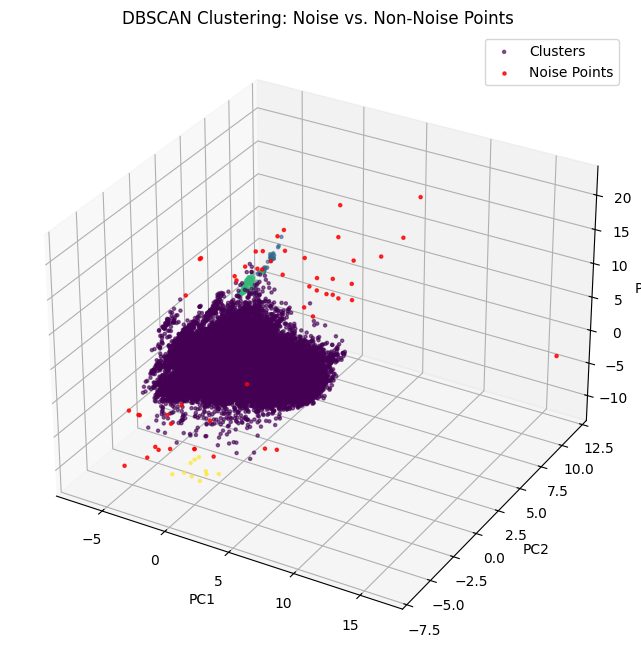

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN

# Step 1: Apply DBSCAN
dbscan = DBSCAN(eps=1.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(pca_3d_result)

# Step 2: Identify Noise & Non-Noise Points
core_mask = dbscan_labels != -1  # Non-noise points (Clusters)
noise_mask = dbscan_labels == -1  # Noise points

# Step 3: 3D Plot of Clusters vs. Noise
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot non-noise points (clusters)
ax.scatter(
    pca_3d_result[core_mask, 0],
    pca_3d_result[core_mask, 1],
    pca_3d_result[core_mask, 2],
    c=dbscan_labels[core_mask], cmap='viridis', s=5, alpha=0.6, label="Clusters"
)

# Plot noise points in red
ax.scatter(
    pca_3d_result[noise_mask, 0],
    pca_3d_result[noise_mask, 1],
    pca_3d_result[noise_mask, 2],
    c='red', s=5, alpha=0.8, label="Noise Points"
)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('DBSCAN Clustering: Noise vs. Non-Noise Points')
ax.legend()
plt.show()


## **ARM**

In [ ]:
arm_df = pd.read_csv('final_hotel_bookings_df_cleaned.csv')

In [ ]:
arm_df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87225,City Hotel,0,23,2017,August,35,30,2,5,2,...,0,0,45.7,24.1,11.0,30.2,Partially cloudy,False,Assumption Day,15
87226,City Hotel,0,102,2017,August,35,31,2,5,3,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
87227,City Hotel,0,34,2017,August,35,31,2,5,2,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16
87228,City Hotel,0,109,2017,August,35,31,2,5,2,...,0,0,47.2,31.1,12.0,22.2,Partially cloudy,False,Assumption Day,16


In [ ]:
# Select categorical columns that represent transaction items
categorical_cols = [
    "hotel", "meal", "market_segment", "distribution_channel",
    "reserved_room_type", "assigned_room_type", "deposit_type",
    "customer_type", "reservation_status", "weather_conditions", "nearest_holiday"
]


# Keep only categorical data for ARM
arm_df_transactions = arm_df[categorical_cols]

arm_df_transactions = arm_df_transactions.applymap(lambda x: str(x).replace(',', '-'))

arm_df_transactions = arm_df_transactions.applymap(lambda x: str(x).replace('"', '').replace("'", ''))

# Save the transaction dataset for use in R
transaction_file = "transactions_arm.csv"
arm_df_transactions.to_csv(transaction_file, index=False, header=False)

# Display a sample of the transactions
arm_df_transactions.head()


<ipython-input-4-9c60a1a56135>:12: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  arm_df_transactions = arm_df_transactions.applymap(lambda x: str(x).replace(',', '-'))
<ipython-input-4-9c60a1a56135>:14: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  arm_df_transactions = arm_df_transactions.applymap(lambda x: str(x).replace('"', '').replace("'", ''))


,hotel,meal,market_segment,distribution_channel,reserved_room_type,assigned_room_type,deposit_type,customer_type,reservation_status,weather_conditions,nearest_holiday
0,Resort Hotel,BB,Direct,Direct,C,C,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
1,Resort Hotel,BB,Direct,Direct,C,C,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
2,Resort Hotel,BB,Direct,Direct,A,C,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
3,Resort Hotel,BB,Corporate,Corporate,A,A,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
4,Resort Hotel,BB,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day


In [ ]:
arm_df_transactions = pd.read_csv('transactions_arm.csv',header=None)

In [ ]:
arm_df_transactions

,0,1,2,3,4,5,6,7,8,9,10
0,Resort Hotel,BB,Direct,Direct,C,C,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
1,Resort Hotel,BB,Direct,Direct,C,C,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
2,Resort Hotel,BB,Direct,Direct,A,C,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
3,Resort Hotel,BB,Corporate,Corporate,A,A,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
4,Resort Hotel,BB,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out,Partially cloudy,Madeira Day
...,...,...,...,...,...,...,...,...,...,...,...
87225,City Hotel,BB,Offline TA/TO,TA/TO,A,A,No Deposit,Transient,Check-Out,Partially cloudy,Assumption Day
87226,City Hotel,BB,Online TA,TA/TO,E,E,No Deposit,Transient,Check-Out,Partially cloudy,Assumption Day
87227,City Hotel,BB,Online TA,TA/TO,D,D,No Deposit,Transient,Check-Out,Partially cloudy,Assumption Day
87228,City Hotel,BB,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out,Partially cloudy,Assumption Day


In [ ]:
install.packages("arules")
install.packages("arulesViz")

library(arules)
library(arulesViz)

resort <- read.transactions("transactions_arm.csv",
                             rm.duplicates = FALSE,
                             format = "basket",
                             sep=",",
                             cols=NULL)


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘iterators’, ‘permute’, ‘zoo’, ‘tweenr’, ‘polyclip’, ‘RcppEigen’, ‘gridExtra’, ‘RcppArmadillo’, ‘ca’, ‘foreach’, ‘gclus’, ‘qap’, ‘registry’, ‘TSP’, ‘vegan’, ‘lmtest’, ‘ggforce’, ‘ggrepel’, ‘viridis’, ‘tidygraph’, ‘graphlayouts’, ‘crosstalk’, ‘lazyeval’, ‘seriation’, ‘vcd’, ‘igraph’, ‘scatterplot3d’, ‘ggraph’, ‘DT’, ‘plotly’, ‘visNetwork’


Loading required package: Matrix


Attaching package: ‘arules’


The following objects are masked from ‘package:base’:

    abbreviate, write


Warning message in asMethod(object):
“removing duplicated items in transactions”


In [ ]:
inspect(resort[1:10])

     items              
[1]  {BB,               
      C,                
      Check-Out,        
      Direct,           
      Madeira Day,      
      No Deposit,       
      Partially cloudy, 
      Resort Hotel,     
      Transient}        
[2]  {BB,               
      C,                
      Check-Out,        
      Direct,           
      Madeira Day,      
      No Deposit,       
      Partially cloudy, 
      Resort Hotel,     
      Transient}        
[3]  {A,                
      BB,               
      C,                
      Check-Out,        
      Direct,           
      Madeira Day,      
      No Deposit,       
      Partially cloudy, 
      Resort Hotel,     
      Transient}        
[4]  {A,                
      BB,               
      Check-Out,        
      Corporate,        
      Madeira Day,      
      No Deposit,       
      Partially cloudy, 
      Resort Hotel,     
      Transient}        
[5]  {A,                
      BB,               


In [ ]:
resort_list <- as(resort, "list")  # Convert transactions to a list


In [ ]:
resort_df <- data.frame(Transaction_ID = seq_along(resort_list),
                        Items = sapply(resort_list, function(x) paste(x, collapse = ", ")))  # Combine items into a single column

View(resort_df)  # Opens the table in RStudio


Transaction_ID,Items
<int>,<chr>
1,"BB, C, Check-Out, Direct, Madeira Day, No Deposit, Partially cloudy, Resort Hotel, Transient"
2,"BB, C, Check-Out, Direct, Madeira Day, No Deposit, Partially cloudy, Resort Hotel, Transient"
3,"A, BB, C, Check-Out, Direct, Madeira Day, No Deposit, Partially cloudy, Resort Hotel, Transient"
4,"A, BB, Check-Out, Corporate, Madeira Day, No Deposit, Partially cloudy, Resort Hotel, Transient"
5,"A, BB, Check-Out, Madeira Day, No Deposit, Online TA, Partially cloudy, Resort Hotel, TA/TO, Transient"
6,"BB, C, Check-Out, Direct, Madeira Day, No Deposit, Partially cloudy, Resort Hotel, Transient"
7,"C, Check-Out, Direct, FB, Madeira Day, No Deposit, Partially cloudy, Resort Hotel, Transient"
8,"A, BB, Canceled, Madeira Day, No Deposit, Online TA, Partially cloudy, Resort Hotel, TA/TO, Transient"
9,"Canceled, D, HB, Madeira Day, No Deposit, Offline TA/TO, Partially cloudy, Resort Hotel, TA/TO, Transient"


## **R Code for ARM Rules**

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Loading required package: Matrix


Attaching package: ‘arules’


The following objects are masked from ‘package:base’:

    abbreviate, write


Warning message in asMethod(object):
“removing duplicated items in transactions”


Streaming output truncated to the last 5000 lines.
[86727] {A,                           
         Assumption Day,              
         BB,                          
         Check-Out,                   
         City Hotel,                  
         Groups,                      
         No Deposit,                  
         Partially cloudy,            
         TA/TO,                       
         Transient-Party}             
[86728] {A,                           
         Assumption Day,              
         BB,                          
         Check-Out,                   
         City Hotel,                  
         No Deposit,                  
         Offline TA/TO,               
         Partially cloudy,            
         TA/TO,                       
         Transient-Party}             
[86729] {A,                           
         Assumption Day,              
         BB,                          
         Check-Out,                   
         City

set of 292 rules

rule length distribution (lhs + rhs):sizes
  2   3   4   5 
 59 131  92  10 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  2.000   3.000   3.000   3.182   4.000   5.000 

summary of quality measures:
    support         confidence        coverage           lift       
 Min.   :0.3511   Min.   :0.5269   Min.   :0.3563   Min.   :0.8899  
 1st Qu.:0.3727   1st Qu.:0.6945   1st Qu.:0.4839   1st Qu.:0.9660  
 Median :0.4149   Median :0.7639   Median :0.5755   Median :0.9998  
 Mean   :0.4515   Mean   :0.7943   Mean   :0.5808   Mean   :1.0344  
 3rd Qu.:0.5069   3rd Qu.:0.9173   3rd Qu.:0.6431   3rd Qu.:1.0564  
 Max.   :0.8138   Max.   :1.0000   Max.   :0.9869   Max.   :1.4841  
     count      
 Min.   :30626  
 1st Qu.:32512  
 Median :36193  
 Mean   :39386  
 3rd Qu.:44216  
 Max.   :70987  

mining info:
   data ntransactions support confidence
 resort         87230    0.35        0.5
                                                                              


--- Top 15 Rules by Support ---
     lhs                        rhs          support   confidence coverage 
[1]  {Transient}             => {No Deposit} 0.8137911 0.9878239  0.8238221
[2]  {No Deposit}            => {Transient}  0.8137911 0.8246152  0.9868738
[3]  {TA/TO}                 => {No Deposit} 0.7805801 0.9864113  0.7913333
[4]  {No Deposit}            => {TA/TO}      0.7805801 0.7909624  0.9868738
[5]  {BB}                    => {No Deposit} 0.7673392 0.9856863  0.7784822
[6]  {No Deposit}            => {BB}         0.7673392 0.7775454  0.9868738
[7]  {Check-Out}             => {No Deposit} 0.7232030 0.9978488  0.7247621
[8]  {No Deposit}            => {Check-Out}  0.7232030 0.7328222  0.9868738
[9]  {TA/TO}                 => {Transient}  0.6509114 0.8225503  0.7913333
[10] {Transient}             => {TA/TO}      0.6509114 0.7901116  0.8238221
[11] {BB}                    => {Transient}  0.6430700 0.8260562  0.7784822
[12] {Transient}             => {BB}         0.6430700 

set of 292 rules

rule length distribution (lhs + rhs):sizes
  2   3   4   5 
 59 131  92  10 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  2.000   3.000   3.000   3.182   4.000   5.000 

summary of quality measures:
    support         confidence        coverage           lift       
 Min.   :0.3511   Min.   :0.5269   Min.   :0.3563   Min.   :0.8899  
 1st Qu.:0.3727   1st Qu.:0.6945   1st Qu.:0.4839   1st Qu.:0.9660  
 Median :0.4149   Median :0.7639   Median :0.5755   Median :0.9998  
 Mean   :0.4515   Mean   :0.7943   Mean   :0.5808   Mean   :1.0344  
 3rd Qu.:0.5069   3rd Qu.:0.9173   3rd Qu.:0.6431   3rd Qu.:1.0564  
 Max.   :0.8138   Max.   :1.0000   Max.   :0.9869   Max.   :1.4841  
     count      
 Min.   :30626  
 1st Qu.:32512  
 Median :36193  
 Mean   :39386  
 3rd Qu.:44216  
 Max.   :70987  

mining info:
   data ntransactions support confidence
 resort         87230    0.35        0.5
                                                                              

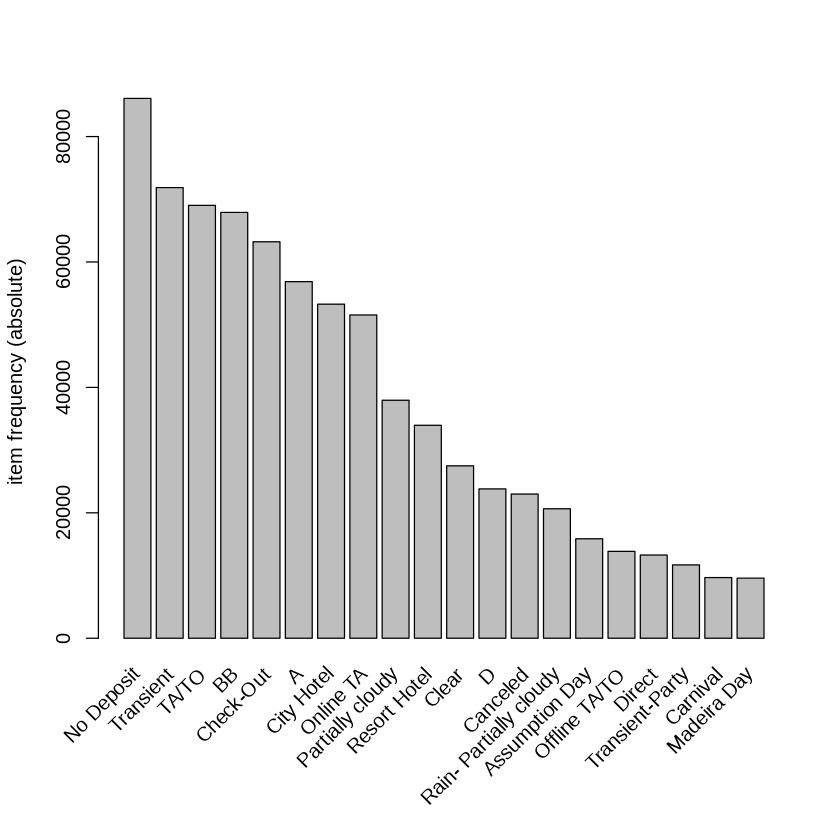

In [ ]:
# Install and load necessary libraries
install.packages("arules")
install.packages("arulesViz")

library(arules)
library(arulesViz)

# Load transaction data
resort <- read.transactions("transactions_arm.csv",
                             rm.duplicates = FALSE,
                             format = "basket",
                             sep=",",
                             cols=NULL)

# Inspect a few transactions
inspect(resort)

# Apply Apriori Algorithm
Frules <- apriori(resort, parameter = list(support=0.35, confidence=0.5, minlen=2))

# Print summary of rules
summary(Frules)

# Print the top 15 rules sorted by Support
cat("\n--- Top 15 Rules by Support ---\n")
inspect(sort(Frules, by="support")[1:15])

# Print the top 15 rules sorted by Confidence
cat("\n--- Top 15 Rules by Confidence ---\n")
inspect(sort(Frules, by="confidence")[1:15])

# Print the top 15 rules sorted by Lift
cat("\n--- Top 15 Rules by Lift ---\n")
inspect(sort(Frules, by="lift")[1:15])

# Plot most frequent items
itemFrequencyPlot(resort, topN=20, type="absolute")

# Sort rules by Confidence
SortedRules <- sort(Frules, by="confidence", decreasing=TRUE)
inspect(SortedRules[1:10])
summary(SortedRules)



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message:
“Unknown control parameters: type, main”


Available control parameters (with default values):
layout	 =  stress
circular	 =  FALSE
ggraphdots	 =  NULL
edges	 =  <environment>
nodes	 =  <environment>
nodetext	 =  <environment>
colors	 =  c("#EE0000FF", "#EEEEEEFF")
engine	 =  ggplot2
max	 =  100
verbose	 =  FALSE


$title
[1] "Network Graph - Top 15 Rules by Support"

attr(,"class")
[1] "labels"

Warning message:
“Unknown control parameters: type, main”


Available control parameters (with default values):
layout	 =  stress
circular	 =  FALSE
ggraphdots	 =  NULL
edges	 =  <environment>
nodes	 =  <environment>
nodetext	 =  <environment>
colors	 =  c("#EE0000FF", "#EEEEEEFF")
engine	 =  ggplot2
max	 =  100
verbose	 =  FALSE


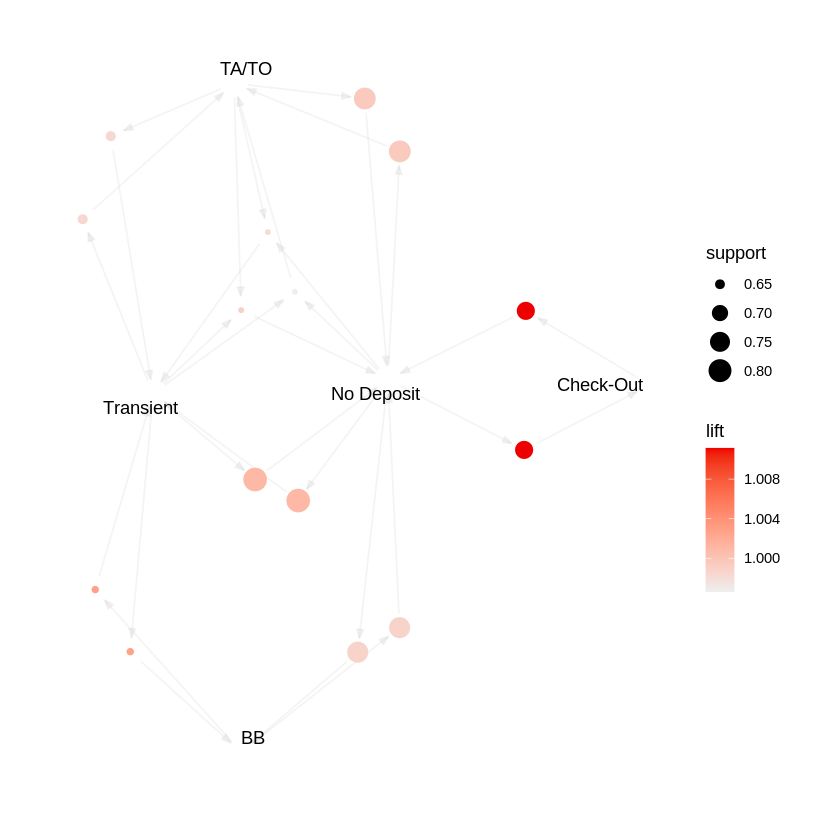

$title
[1] "Network Graph - Top 15 Rules by Confidence"

attr(,"class")
[1] "labels"

Warning message:
“Unknown control parameters: type, main”


Available control parameters (with default values):
layout	 =  stress
circular	 =  FALSE
ggraphdots	 =  NULL
edges	 =  <environment>
nodes	 =  <environment>
nodetext	 =  <environment>
colors	 =  c("#EE0000FF", "#EEEEEEFF")
engine	 =  ggplot2
max	 =  100
verbose	 =  FALSE


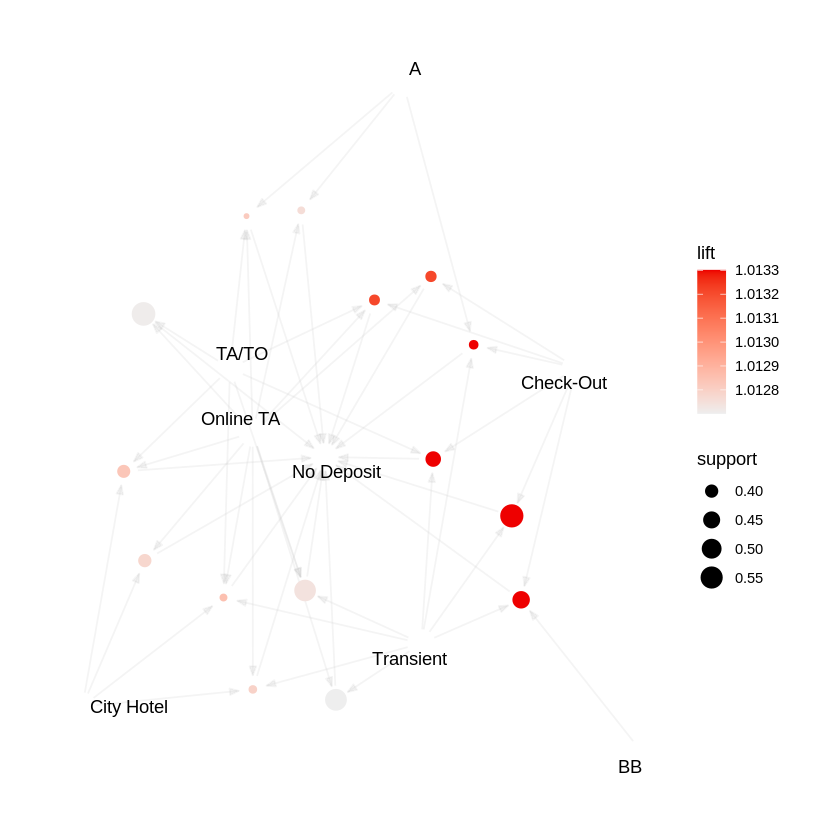

$title
[1] "Network Graph - Top 15 Rules by Lift"

attr(,"class")
[1] "labels"

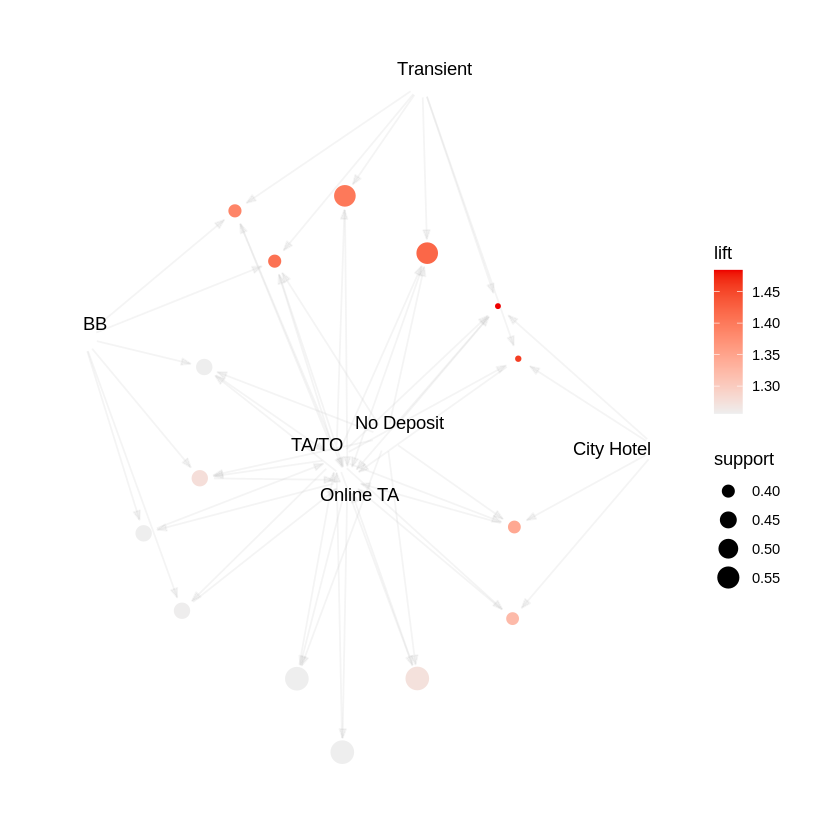

In [ ]:
# Install and load necessary libraries
install.packages("arules")
install.packages("arulesViz")
install.packages("igraph")
install.packages("ggplot2")
library(ggplot2)

library(arules)
library(arulesViz)
library(igraph)


# Step 3: Generate and Plot Network Graphs for Different Metrics

# Network Graph: Top Rules by Support
top_support <- sort(Frules, by="support")[1:15]
plot(top_support, method="graph", control=list(type="items"), main="Network Graph (Support)")
ggtitle("Network Graph - Top 15 Rules by Support")

# Network Graph: Top Rules by Confidence
top_confidence <- sort(Frules, by="confidence")[1:15]
plot(top_confidence, method="graph", control=list(type="items"), main="Network Graph (Confidence)")
ggtitle("Network Graph - Top 15 Rules by Confidence")

# Network Graph: Top Rules by Lift
top_lift <- sort(Frules, by="lift")[1:15]
plot(top_lift, method="graph", control=list(type="items"), main="Network Graph (Lift)")
ggtitle("Network Graph - Top 15 Rules by Lift")


## **Naive Bayes Approach**

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.naive_bayes import CategoricalNB, BernoulliNB, MultinomialNB, GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import OrdinalEncoder

# Load dataset
df = pd.read_csv("final_hotel_bookings_df_cleaned.csv")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87230 entries, 0 to 87229
Data columns (total 49 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           87230 non-null  object 
 1   is_canceled                     87230 non-null  int64  
 2   lead_time                       87230 non-null  int64  
 3   arrival_date_year               87230 non-null  int64  
 4   arrival_date_month              87230 non-null  object 
 5   arrival_date_week_number        87230 non-null  int64  
 6   arrival_date_day_of_month       87230 non-null  int64  
 7   stays_in_weekend_nights         87230 non-null  int64  
 8   stays_in_week_nights            87230 non-null  int64  
 9   adults                          87230 non-null  int64  
 10  children                        87230 non-null  float64
 11  babies                          87230 non-null  int64  
 12  meal                            

In [ ]:
df.head(5)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0


<Figure size 600x500 with 0 Axes>

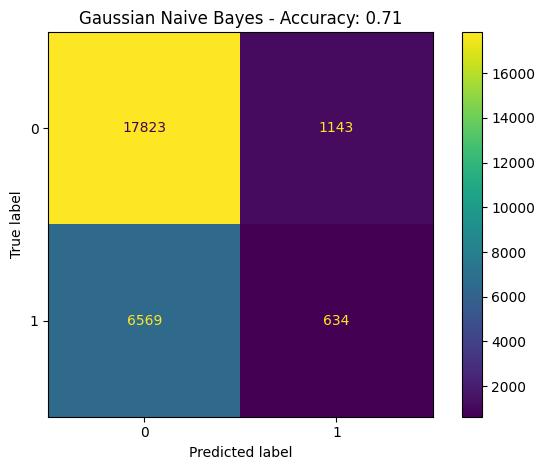

<Figure size 600x500 with 0 Axes>

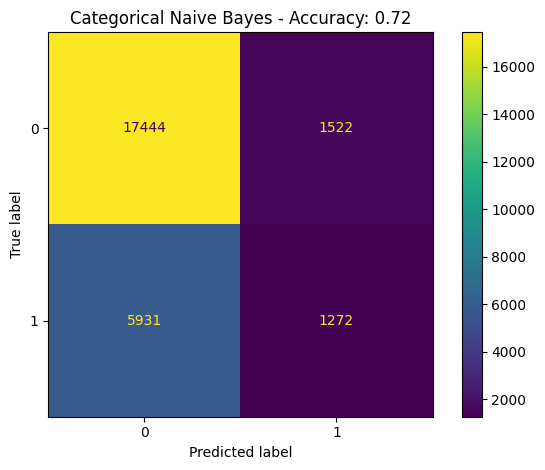

<Figure size 600x500 with 0 Axes>

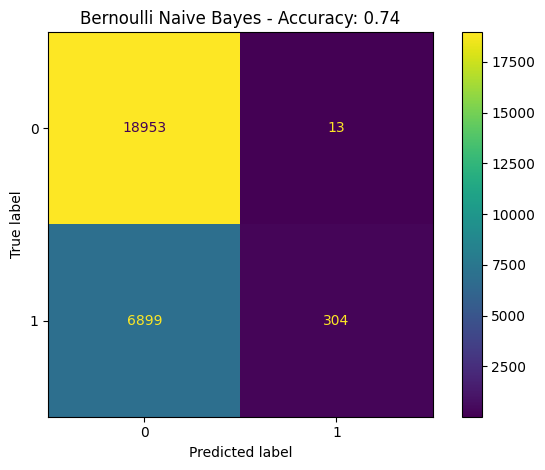

<Figure size 600x500 with 0 Axes>

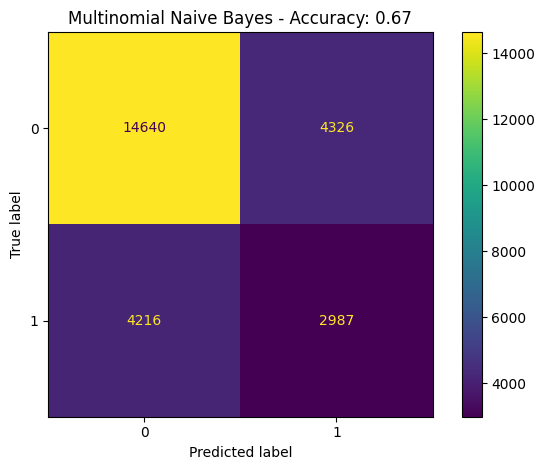

In [ ]:

# ----------------------------
# Single Train/Test Split
# ----------------------------
train_df, test_df = train_test_split(df, test_size=0.3, random_state=42, stratify=df["is_canceled"])
train_labels = train_df["is_canceled"]
test_labels = test_df["is_canceled"]
train_df = train_df.drop(columns=["is_canceled"])
test_df = test_df.drop(columns=["is_canceled"])

# ----------------------------
# Multinomial NB Features
# ----------------------------
features_mn = [
    'lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
    'adults', 'children', 'babies',
    'previous_cancellations', 'previous_bookings_not_canceled',
    'booking_changes', 'days_in_waiting_list',
    'total_of_special_requests'
]
X_train_mn = train_df[features_mn].fillna(0).astype(int)
X_test_mn = test_df[features_mn].fillna(0).astype(int)

# ----------------------------
# Gaussian NB Features
# ----------------------------
features_g = [
    'adr', 'avg_temp', 'humidity', 'precipitation', 'feels_like_temp',
    'avg_wind_speed', 'visibility_km'
]
X_train_g = train_df[features_g].fillna(0)
X_test_g = test_df[features_g].fillna(0)

# ----------------------------
# Bernoulli NB Features
# ----------------------------
features_b = [
    'is_repeated_guest', 'required_car_parking_spaces', 'is_holiday_week',
    'booking_changes', 'previous_cancellations'
]
X_train_b = train_df[features_b].astype(int)
X_test_b = test_df[features_b].astype(int)

# ----------------------------
# Categorical NB Features
# ----------------------------
features_c = [
    'hotel', 'meal', 'market_segment', 'distribution_channel',
    'reserved_room_type', 'deposit_type', 'customer_type'
]
X_train_c = train_df[features_c].copy()
X_test_c = test_df[features_c].copy()
encoder = OrdinalEncoder()
X_train_c[features_c] = encoder.fit_transform(X_train_c[features_c])
X_test_c[features_c] = encoder.transform(X_test_c[features_c])

# ----------------------------
# Train, Predict, Visualize Function
# ----------------------------
def train_and_plot(model, X_train, y_train, X_test, y_test, title):
    clf = model.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_).plot()
    plt.title(f"{title} - Accuracy: {clf.score(X_test, y_test):.2f}")
    plt.tight_layout()
    plt.show()
    return clf.score(X_test, y_test)

# ----------------------------
# Train and Visualize All Models
# ----------------------------
acc_gnb = train_and_plot(GaussianNB(), X_train_g, train_labels, X_test_g, test_labels, "Gaussian Naive Bayes")
acc_cnb = train_and_plot(CategoricalNB(), X_train_c, train_labels, X_test_c, test_labels, "Categorical Naive Bayes")
acc_bnb = train_and_plot(BernoulliNB(), X_train_b, train_labels, X_test_b, test_labels, "Bernoulli Naive Bayes")
acc_mnb = train_and_plot(MultinomialNB(), X_train_mn, train_labels, X_test_mn, test_labels, "Multinomial Naive Bayes")




In [ ]:
X_train_mn.head(5)

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,total_of_special_requests
74233,43,0,3,2,2,0,0,0,0,0,1
9004,6,1,0,1,0,0,0,0,1,0,0
6124,311,4,10,2,0,0,0,0,0,0,0
19135,31,2,1,1,0,0,0,0,0,0,1
29017,150,2,5,2,0,0,0,0,0,0,1


In [ ]:
X_train_mn.to_csv('X_train_mn.csv', index=False)

In [ ]:
X_test_mn.head(5)

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,total_of_special_requests
6438,65,2,1,2,0,0,0,0,0,0,1
10782,162,4,6,1,0,0,0,4,2,0,1
45375,27,0,4,3,0,0,0,0,3,0,1
34133,98,1,1,3,0,0,0,0,0,0,1
52629,168,2,1,3,0,0,0,0,0,0,0


In [ ]:
X_test_mn.to_csv('X_test_mn.csv', index=False)

In [ ]:
train_labels

,is_canceled
74233,0
9004,1
6124,1
19135,0
29017,0
...,...
81325,0
84065,0
4255,1
61176,0


In [ ]:
test_labels

,is_canceled
6438,1
10782,0
45375,1
34133,1
52629,1
...,...
59611,0
45671,1
29635,0
21628,0


In [ ]:
(acc_gnb, acc_cnb, acc_bnb, acc_mnb)

(0.7053001643165577,
 0.7151973709350758,
 0.7358706866903588,
 0.6735832473537392)

## **Decision Tree**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

# ----------------------------
# Load Dataset
# ----------------------------
df = pd.read_csv("final_hotel_bookings_df_cleaned.csv")

# ----------------------------
# Train/Test Split
# ----------------------------
train_df, test_df = train_test_split(df, test_size=0.3, random_state=42, stratify=df["is_canceled"])
train_labels = train_df["is_canceled"]
test_labels = test_df["is_canceled"]
train_df = train_df.drop(columns=["is_canceled"])
test_df = test_df.drop(columns=["is_canceled"])


In [ ]:
# Correlations and feature types to select a richer, non-redundant set of features for Decision Tree modeling

# Step 1: Drop target column temporarily to compute correlations and unique counts
df_no_target = df.drop(columns=["is_canceled"])

# Step 2: Separate columns by type
numeric_features = df_no_target.select_dtypes(include=['int64', 'float64', 'bool']).columns.tolist()
categorical_features = df_no_target.select_dtypes(include=['object']).columns.tolist()

# Step 3: Calculate correlation of numeric features with target
correlations = df[numeric_features + ['is_canceled']].corr()['is_canceled'].drop('is_canceled').sort_values(ascending=False)

# Step 4: Count unique values in categorical features
cat_unique_counts = df[categorical_features].nunique().sort_values()

correlations, cat_unique_counts


(lead_time                         0.184515
 adr                               0.127233
 arrival_date_year                 0.088020
 stays_in_week_nights              0.084159
 adults                            0.080271
 children                          0.067182
 stays_in_weekend_nights           0.060992
 max_temp                          0.057839
 avg_temp                          0.053144
 feels_like_temp                   0.052736
 previous_cancellations            0.051501
 min_temp                          0.046634
 is_holiday_week                   0.022299
 visibility_km                     0.009315
 arrival_date_day_of_month         0.005449
 days_in_waiting_list              0.004710
 max_wind_gust                     0.003254
 arrival_date_week_number          0.001691
 avg_wind_speed                   -0.002140
 precipitation                    -0.003187
 agent                            -0.007092
 humidity                         -0.014535
 cloud_cover                    

<Figure size 600x500 with 0 Axes>

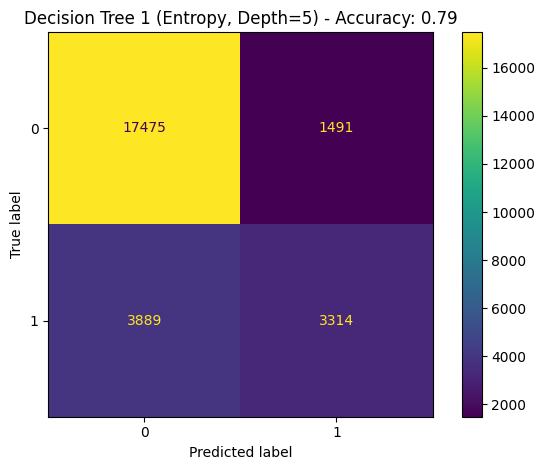

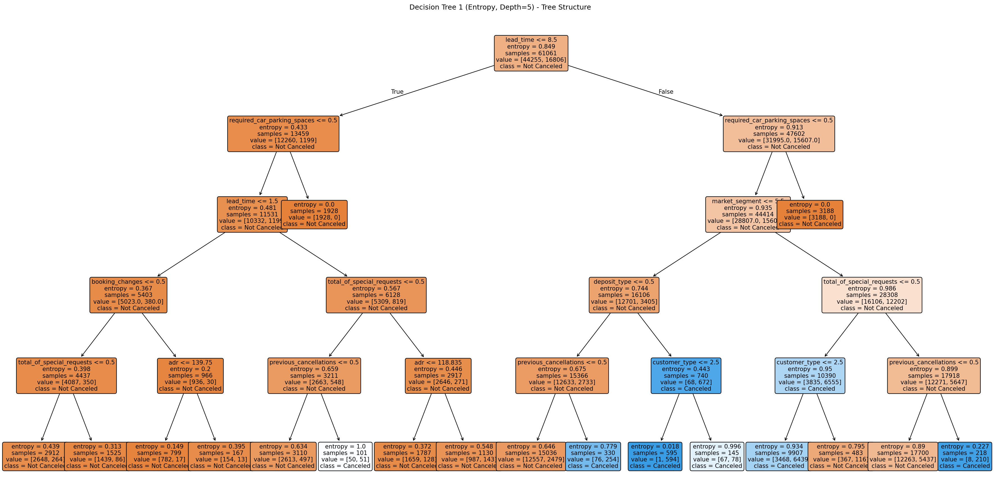

<Figure size 600x500 with 0 Axes>

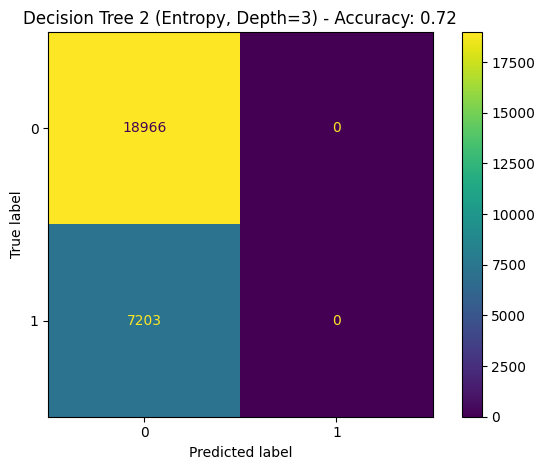

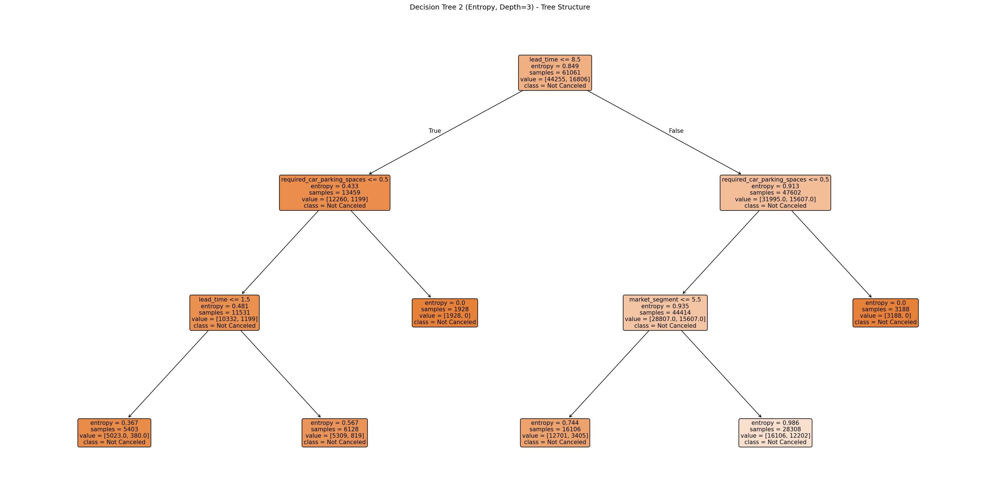

<Figure size 600x500 with 0 Axes>

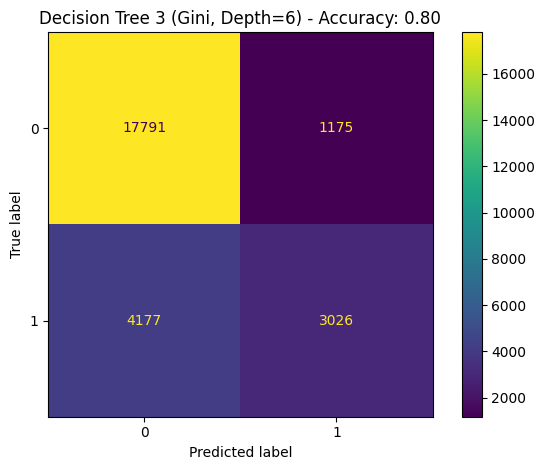

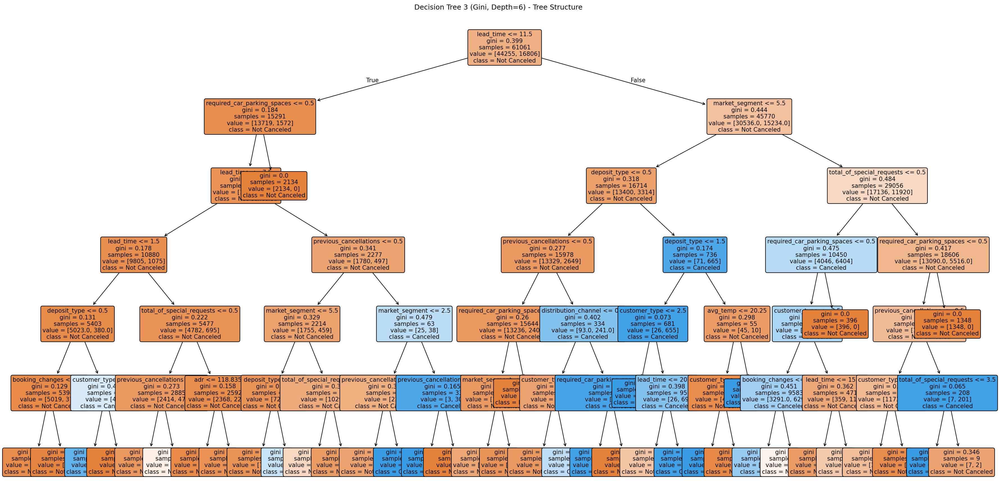

(0.7944132370361878, 0.7247506591768886, 0.7954832053192709)

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

# Updated feature set with informative, non-redundant features
final_features = [
    # Numerical
    'lead_time', 'adr', 'stays_in_week_nights', 'stays_in_weekend_nights',
    'adults', 'children', 'previous_cancellations', 'total_of_special_requests',
    'booking_changes', 'is_repeated_guest', 'required_car_parking_spaces',
    'avg_temp', 'feels_like_temp', 'humidity', 'precipitation',

    # Categorical (low cardinality)
    'hotel', 'meal', 'market_segment', 'deposit_type', 'customer_type',
    'distribution_channel', 'reserved_room_type', 'is_holiday_week'
]

# Separate numerical and categorical for encoding
categorical_cols = ['hotel', 'meal', 'market_segment', 'deposit_type',
                    'customer_type', 'distribution_channel', 'reserved_room_type']
numerical_cols = list(set(final_features) - set(categorical_cols))

# Prepare training data
X_train_dt_full = train_df[final_features].copy()
X_test_dt_full = test_df[final_features].copy()

# Encode categorical features
encoder_dt = OrdinalEncoder()
X_train_dt_full[categorical_cols] = encoder_dt.fit_transform(X_train_dt_full[categorical_cols])
X_test_dt_full[categorical_cols] = encoder_dt.transform(X_test_dt_full[categorical_cols])

# ----------------------------
# Train Three New Decision Trees with Final Feature Set
# ----------------------------
# Tree 1
tree1_full = DecisionTreeClassifier(criterion="entropy", max_depth=5, random_state=42)
tree1_full.fit(X_train_dt_full, train_labels)
pred1_full = tree1_full.predict(X_test_dt_full)
acc1_full = accuracy_score(test_labels, pred1_full)
cm1_full = confusion_matrix(test_labels, pred1_full)

# Tree 2
tree2_full = DecisionTreeClassifier(criterion="entropy", max_depth=3, random_state=7)
tree2_full.fit(X_train_dt_full, train_labels)
pred2_full = tree2_full.predict(X_test_dt_full)
acc2_full = accuracy_score(test_labels, pred2_full)
cm2_full = confusion_matrix(test_labels, pred2_full)

# Tree 3
tree3_full = DecisionTreeClassifier(criterion="gini", max_depth=6, random_state=21)
tree3_full.fit(X_train_dt_full, train_labels)
pred3_full = tree3_full.predict(X_test_dt_full)
acc3_full = accuracy_score(test_labels, pred3_full)
cm3_full = confusion_matrix(test_labels, pred3_full)

# ----------------------------
# Visualization Function
# ----------------------------
def plot_updated_tree(model, title, cm, acc):
    plt.figure(figsize=(6, 5))
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_).plot()
    plt.title(f"{title} - Accuracy: {acc:.2f}")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(24, 12),dpi=150)
    plot_tree(model, feature_names=final_features, class_names=["Not Canceled", "Canceled"], filled=True,rounded=True,fontsize=10)
    plt.title(f"{title} - Tree Structure")
    plt.tight_layout()
    plt.show()

# ----------------------------
# Plot All Updated Trees
# ----------------------------
plot_updated_tree(tree1_full, "Decision Tree 1 (Entropy, Depth=5)", cm1_full, acc1_full)
plot_updated_tree(tree2_full, "Decision Tree 2 (Entropy, Depth=3)", cm2_full, acc2_full)
plot_updated_tree(tree3_full, "Decision Tree 3 (Gini, Depth=6)", cm3_full, acc3_full)

(acc1_full, acc2_full, acc3_full)


In [ ]:
X_train_dt_full.head()

,lead_time,adr,stays_in_week_nights,stays_in_weekend_nights,adults,children,previous_cancellations,total_of_special_requests,booking_changes,is_repeated_guest,...,humidity,precipitation,hotel,meal,market_segment,deposit_type,customer_type,distribution_channel,reserved_room_type,is_holiday_week
74233,43,349.63,3,0,2,2.0,0,1,0,0,...,71.6,0.0,0.0,2.0,6.0,0.0,2.0,3.0,5.0,True
9004,6,107.95,0,1,1,0.0,0,0,1,0,...,33.4,0.0,1.0,0.0,5.0,0.0,2.0,3.0,0.0,True
6124,311,85.11,10,4,2,0.0,0,0,0,0,...,56.3,0.0,1.0,0.0,5.0,0.0,2.0,3.0,0.0,False
19135,31,91.67,1,2,1,0.0,0,1,0,0,...,64.5,0.0,1.0,0.0,6.0,0.0,2.0,3.0,4.0,True
29017,150,41.98,5,2,2,0.0,0,1,0,0,...,85.7,0.0,1.0,0.0,3.0,0.0,2.0,1.0,0.0,False


In [ ]:
X_train_dt_full.to_csv('X_train_dt_full.csv', index=False)

In [ ]:
X_test_dt_full.head()

,lead_time,adr,stays_in_week_nights,stays_in_weekend_nights,adults,children,previous_cancellations,total_of_special_requests,booking_changes,is_repeated_guest,...,humidity,precipitation,hotel,meal,market_segment,deposit_type,customer_type,distribution_channel,reserved_room_type,is_holiday_week
6438,65,99.00,1,2,2,0.0,0,1,0,0,...,60.9,0.000,1.0,0.0,6.0,0.0,2.0,3.0,4.0,True
10782,162,69.30,6,4,1,0.0,0,1,2,0,...,50.1,0.000,1.0,0.0,3.0,0.0,2.0,1.0,3.0,True
45375,27,171.44,4,0,3,0.0,0,1,3,0,...,88.2,0.005,0.0,0.0,6.0,0.0,2.0,3.0,3.0,True
34133,98,124.25,1,1,3,0.0,0,1,0,0,...,58.4,0.000,0.0,0.0,6.0,0.0,2.0,3.0,3.0,False
52629,168,175.50,1,2,3,0.0,0,0,0,0,...,83.4,0.000,0.0,0.0,6.0,0.0,2.0,3.0,3.0,False


In [ ]:
X_test_dt_full.to_csv('X_test_dt_full.csv', index=False)

In [ ]:
train_labels.head()

,is_canceled
74233,0
9004,1
6124,1
19135,0
29017,0


In [ ]:
test_labels.head()

,is_canceled
6438,1
10782,0
45375,1
34133,1
52629,1


## **Three different decision trees with different root nodes**

<Figure size 600x500 with 0 Axes>

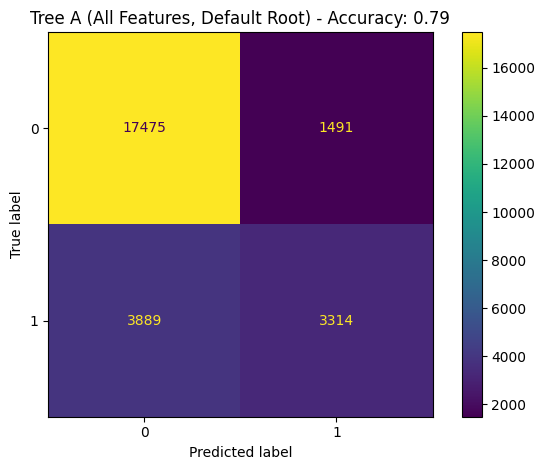

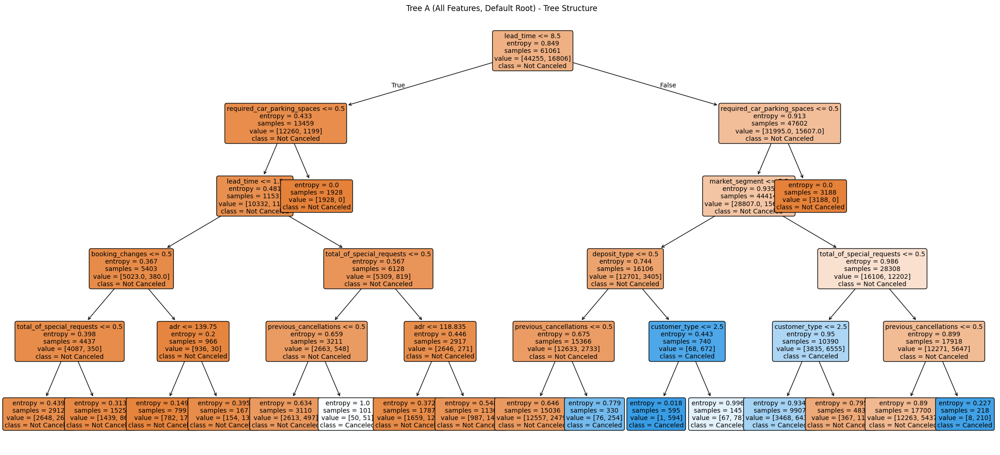

<Figure size 600x500 with 0 Axes>

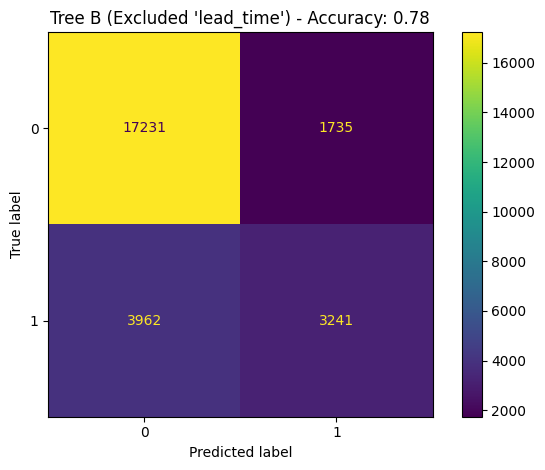

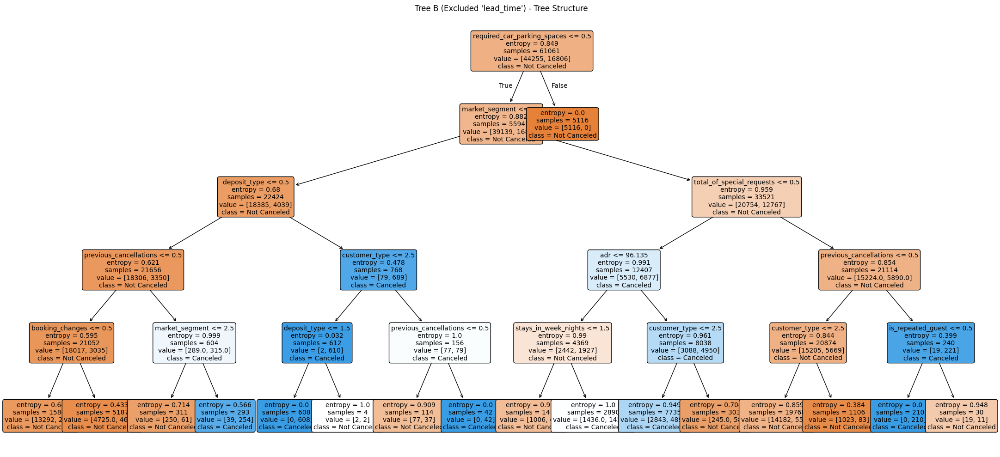

<Figure size 600x500 with 0 Axes>

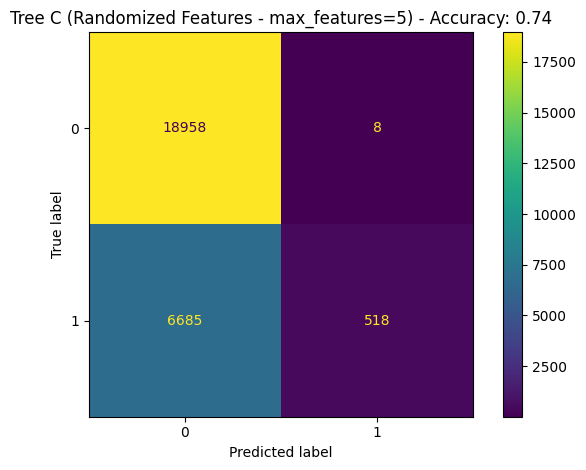

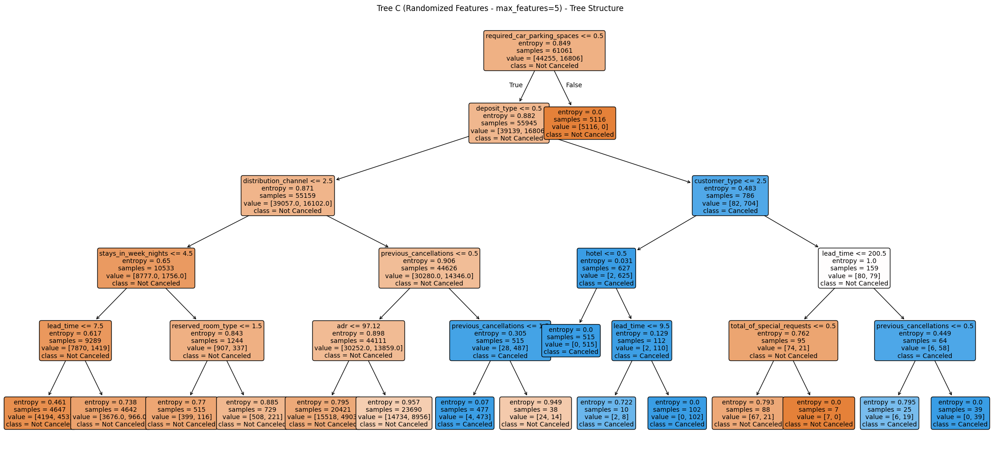

(0.7944132370361878, 0.7822996675455692, 0.7442393671901869)

In [ ]:
# Modify training data for plotting trees with different root nodes (by excluding lead_time strategically)

# Tree A: Default tree with all features (lead_time likely root)
X_train_a = X_train_dt_full.copy()
X_test_a = X_test_dt_full.copy()

# Tree B: Remove 'lead_time' to force different root
X_train_b = X_train_dt_full.drop(columns=["lead_time"])
X_test_b = X_test_dt_full.drop(columns=["lead_time"])

# Tree C: Keep all features but use max_features to limit root selection
X_train_c = X_train_dt_full.copy()
X_test_c = X_test_dt_full.copy()

# Tree A: Default
tree_a = DecisionTreeClassifier(criterion="entropy", max_depth=5, random_state=0)
tree_a.fit(X_train_a, train_labels)
cm_a = confusion_matrix(test_labels, tree_a.predict(X_test_a))
acc_a = accuracy_score(test_labels, tree_a.predict(X_test_a))

# Tree B: No lead_time
tree_b = DecisionTreeClassifier(criterion="entropy", max_depth=5, random_state=1)
tree_b.fit(X_train_b, train_labels)
cm_b = confusion_matrix(test_labels, tree_b.predict(X_test_b))
acc_b = accuracy_score(test_labels, tree_b.predict(X_test_b))

# Tree C: Random feature subset
tree_c = DecisionTreeClassifier(criterion="entropy", max_depth=5, max_features=5, random_state=2)
tree_c.fit(X_train_c, train_labels)
cm_c = confusion_matrix(test_labels, tree_c.predict(X_test_c))
acc_c = accuracy_score(test_labels, tree_c.predict(X_test_c))

# Plotting Function
def plot_tree_forced(model, title, cm, acc, feature_names):
    plt.figure(figsize=(6, 5))
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_).plot()
    plt.title(f"{title} - Accuracy: {acc:.2f}")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(22, 10))
    plot_tree(model, feature_names=feature_names, class_names=["Not Canceled", "Canceled"], filled=True,rounded=True, fontsize=10)
    plt.title(f"{title} - Tree Structure")
    plt.tight_layout()
    plt.show()

# Plot all trees with varied roots
plot_tree_forced(tree_a, "Tree A (All Features, Default Root)", cm_a, acc_a, X_train_a.columns)
plot_tree_forced(tree_b, "Tree B (Excluded 'lead_time')", cm_b, acc_b, X_train_b.columns)
plot_tree_forced(tree_c, "Tree C (Randomized Features - max_features=5)", cm_c, acc_c, X_train_c.columns)

(acc_a, acc_b, acc_c)


## **Logistic Regression**


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

# ----------------------------
# Load Dataset
# ----------------------------
df = pd.read_csv("final_hotel_bookings_df_cleaned.csv")

# ----------------------------
# Train/Test Split
# ----------------------------
train_df, test_df = train_test_split(df, test_size=0.3, random_state=42, stratify=df["is_canceled"])
train_labels = train_df["is_canceled"]
test_labels = test_df["is_canceled"]
train_df = train_df.drop(columns=["is_canceled"])
test_df = test_df.drop(columns=["is_canceled"])


<Figure size 600x500 with 0 Axes>

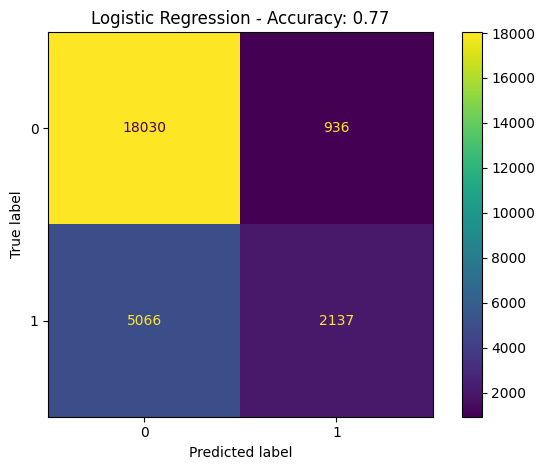

({'0': {'precision': 0.7806546588153793,
   'recall': 0.950648528946536,
   'f1-score': 0.8573058817935428,
   'support': 18966.0},
  '1': {'precision': 0.6954116498535633,
   'recall': 0.296681938081355,
   'f1-score': 0.41592059166991047,
   'support': 7203.0},
  'accuracy': 0.7706446558905575,
  'macro avg': {'precision': 0.7380331543344714,
   'recall': 0.6236652335139454,
   'f1-score': 0.6366132367317267,
   'support': 26169.0},
  'weighted avg': {'precision': 0.757191576788861,
   'recall': 0.7706446558905575,
   'f1-score': 0.7358148716379953,
   'support': 26169.0}},
 0.7706446558905575)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report

# ----------------------------
# Feature Selection for Logistic Regression
# ----------------------------
# Using same feature set used for updated Decision Tree model
logreg_features = final_features  # includes numerical + encoded categorical

# Prepare data
X_train_lr = train_df[logreg_features].copy()
X_test_lr = test_df[logreg_features].copy()

# Encode categorical features
X_train_lr[categorical_cols] = encoder_dt.transform(X_train_lr[categorical_cols])
X_test_lr[categorical_cols] = encoder_dt.transform(X_test_lr[categorical_cols])

# Standardize numeric features
scaler = StandardScaler()
X_train_lr[numerical_cols] = scaler.fit_transform(X_train_lr[numerical_cols])
X_test_lr[numerical_cols] = scaler.transform(X_test_lr[numerical_cols])

# ----------------------------
# Train Logistic Regression
# ----------------------------
logreg = LogisticRegression(max_iter=1000, random_state=42)
logreg.fit(X_train_lr, train_labels)
logreg_preds = logreg.predict(X_test_lr)
logreg_acc = accuracy_score(test_labels, logreg_preds)
logreg_cm = confusion_matrix(test_labels, logreg_preds)

# ----------------------------
# Plot Confusion Matrix and Classification Report
# ----------------------------
plt.figure(figsize=(6, 5))
ConfusionMatrixDisplay(confusion_matrix=logreg_cm, display_labels=logreg.classes_).plot()
plt.title(f"Logistic Regression - Accuracy: {logreg_acc:.2f}")
plt.tight_layout()
plt.show()

classification_report_logreg = classification_report(test_labels, logreg_preds, output_dict=True)
classification_report_logreg, logreg_acc


In [ ]:
X_train_lr.head()

,lead_time,adr,stays_in_week_nights,stays_in_weekend_nights,adults,children,previous_cancellations,total_of_special_requests,booking_changes,is_repeated_guest,...,humidity,precipitation,hotel,meal,market_segment,deposit_type,customer_type,distribution_channel,reserved_room_type,is_holiday_week
74233,-0.430933,4.330107,0.186371,-0.978150,0.199371,4.084532,-0.080203,0.361029,-0.378068,-0.199801,...,0.116500,-0.277619,0.0,2.0,6.0,0.0,2.0,3.0,5.0,0.993422
9004,-0.861646,0.021077,-1.292511,-0.003066,-1.449525,-0.304750,-0.080203,-0.839929,1.019765,-0.199801,...,-2.682058,-0.277619,1.0,0.0,5.0,0.0,2.0,3.0,0.0,0.993422
6124,2.688827,-0.386148,3.637095,2.922186,0.199371,-0.304750,-0.080203,-0.839929,-0.378068,-0.199801,...,-1.004389,-0.277619,1.0,0.0,5.0,0.0,2.0,3.0,0.0,-1.006622
19135,-0.570623,-0.269187,-0.799550,0.972018,-1.449525,-0.304750,-0.080203,0.361029,-0.378068,-0.199801,...,-0.403651,-0.277619,1.0,0.0,6.0,0.0,2.0,3.0,4.0,0.993422
29017,0.814643,-1.155134,1.172292,0.972018,0.199371,-0.304750,-0.080203,0.361029,-0.378068,-0.199801,...,1.149476,-0.277619,1.0,0.0,3.0,0.0,2.0,1.0,0.0,-1.006622


In [ ]:
X_train_lr.to_csv('X_train_lr.csv',index=False)

In [ ]:
X_test_lr.head()

,lead_time,adr,stays_in_week_nights,stays_in_weekend_nights,adults,children,previous_cancellations,total_of_special_requests,booking_changes,is_repeated_guest,...,humidity,precipitation,hotel,meal,market_segment,deposit_type,customer_type,distribution_channel,reserved_room_type,is_holiday_week
6438,-0.174833,-0.138497,-0.799550,0.972018,0.199371,-0.30475,-0.080203,0.361029,-0.378068,-0.199801,...,-0.667389,-0.277619,1.0,0.0,6.0,0.0,2.0,3.0,4.0,0.993422
10782,0.954334,-0.668032,1.665253,2.922186,-1.449525,-0.30475,-0.080203,0.361029,2.417598,-0.199801,...,-1.458605,-0.277619,1.0,0.0,3.0,0.0,2.0,1.0,3.0,0.993422
45375,-0.617187,1.153071,0.679331,-0.978150,1.848268,-0.30475,-0.080203,0.361029,3.815431,-0.199801,...,1.332627,-0.276706,0.0,0.0,6.0,0.0,2.0,3.0,3.0,0.993422
34133,0.209317,0.311698,-0.799550,-0.003066,1.848268,-0.30475,-0.080203,0.361029,-0.378068,-0.199801,...,-0.850541,-0.277619,0.0,0.0,6.0,0.0,2.0,3.0,3.0,-1.006622
52629,1.024179,1.225459,-0.799550,0.972018,1.848268,-0.30475,-0.080203,-0.839929,-0.378068,-0.199801,...,0.980976,-0.277619,0.0,0.0,6.0,0.0,2.0,3.0,3.0,-1.006622


In [ ]:
X_test_lr.to_csv('X_test_lr.csv',index=False)

In [ ]:
train_labels.head()

,is_canceled
74233,0
9004,1
6124,1
19135,0
29017,0


In [ ]:
test_labels.head()

,is_canceled
6438,1
10782,0
45375,1
34133,1
52629,1


## **Comparison of Logistic Regression and Multinomial Naive Bayes models**

<Figure size 600x500 with 0 Axes>

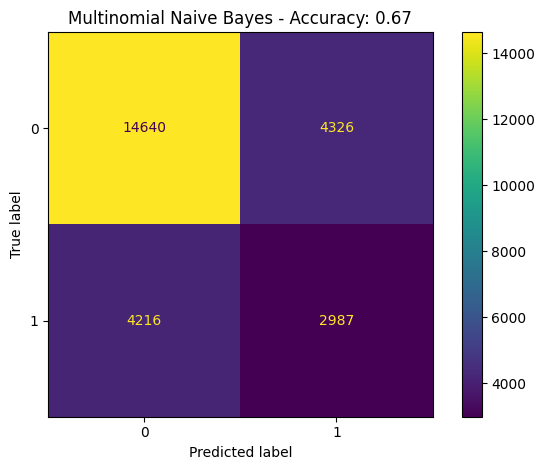

<Figure size 600x500 with 0 Axes>

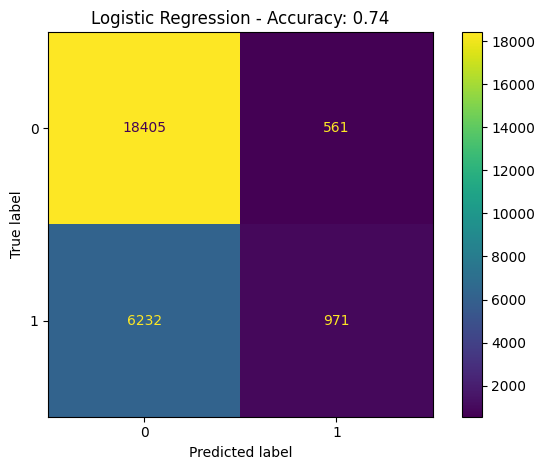

({'0': {'precision': 0.7764106915570641,
   'recall': 0.7719076241695666,
   'f1-score': 0.7741526095923008,
   'support': 18966.0},
  '1': {'precision': 0.4084507042253521,
   'recall': 0.41468832430931557,
   'f1-score': 0.41154588040782586,
   'support': 7203.0},
  'accuracy': 0.6735832473537392,
  'macro avg': {'precision': 0.5924306978912082,
   'recall': 0.5932979742394411,
   'f1-score': 0.5928492450000633,
   'support': 26169.0},
  'weighted avg': {'precision': 0.67512994759473,
   'recall': 0.6735832473537392,
   'f1-score': 0.6743453464062495,
   'support': 26169.0}},
 {'0': {'precision': 0.7470471242440232,
   'recall': 0.9704207529262892,
   'f1-score': 0.8442079673416967,
   'support': 18966.0},
  '1': {'precision': 0.6338120104438643,
   'recall': 0.1348049423851173,
   'f1-score': 0.22232398397252431,
   'support': 7203.0},
  'accuracy': 0.7404180518934618,
  'macro avg': {'precision': 0.6904295673439438,
   'recall': 0.5526128476557033,
   'f1-score': 0.5332659756571105

In [ ]:
# Perform both Logistic Regression and Multinomial Naive Bayes classification
# using the cleaned hotel booking dataset

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report

# ----------------------------
# Load Dataset
# ----------------------------
df = pd.read_csv("final_hotel_bookings_df_cleaned.csv")

# ----------------------------
# Train-Test Split
# ----------------------------
train_df, test_df = train_test_split(df, test_size=0.3, random_state=42, stratify=df["is_canceled"])
train_labels = train_df["is_canceled"]
test_labels = test_df["is_canceled"]
train_df = train_df.drop(columns=["is_canceled"])
test_df = test_df.drop(columns=["is_canceled"])

# ----------------------------
# Shared Feature Set (behavioral and booking related)
# ----------------------------
features_common = [
    'lead_time', 'stays_in_week_nights', 'stays_in_weekend_nights',
    'adults', 'children', 'babies', 'previous_cancellations',
    'previous_bookings_not_canceled', 'booking_changes',
    'days_in_waiting_list', 'total_of_special_requests'
]

# ----------------------------
# Multinomial Naive Bayes
# ----------------------------
X_train_mnb = train_df[features_common].fillna(0).astype(int)
X_test_mnb = test_df[features_common].fillna(0).astype(int)

mnb_model = MultinomialNB()
mnb_model.fit(X_train_mnb, train_labels)
mnb_preds = mnb_model.predict(X_test_mnb)

mnb_acc = accuracy_score(test_labels, mnb_preds)
mnb_cm = confusion_matrix(test_labels, mnb_preds)

plt.figure(figsize=(6, 5))
ConfusionMatrixDisplay(confusion_matrix=mnb_cm, display_labels=mnb_model.classes_).plot()
plt.title(f"Multinomial Naive Bayes - Accuracy: {mnb_acc:.2f}")
plt.tight_layout()
plt.show()

# ----------------------------
# Logistic Regression
# ----------------------------
X_train_lr = train_df[features_common].copy()
X_test_lr = test_df[features_common].copy()

scaler = StandardScaler()
X_train_lr = scaler.fit_transform(X_train_lr)
X_test_lr = scaler.transform(X_test_lr)

lr_model = LogisticRegression(max_iter=1000, random_state=42)
lr_model.fit(X_train_lr, train_labels)
lr_preds = lr_model.predict(X_test_lr)

lr_acc = accuracy_score(test_labels, lr_preds)
lr_cm = confusion_matrix(test_labels, lr_preds)

plt.figure(figsize=(6, 5))
ConfusionMatrixDisplay(confusion_matrix=lr_cm, display_labels=lr_model.classes_).plot()
plt.title(f"Logistic Regression - Accuracy: {lr_acc:.2f}")
plt.tight_layout()
plt.show()

# Return classification reports and accuracies
mnb_report = classification_report(test_labels, mnb_preds, output_dict=True)
lr_report = classification_report(test_labels, lr_preds, output_dict=True)

mnb_report, lr_report, mnb_acc, lr_acc


##**SVM**

In [3]:
# Load the uploaded dataset
file_path = "final_hotel_bookings_df_cleaned.csv"
df = pd.read_csv(file_path)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87230 entries, 0 to 87229
Data columns (total 49 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           87230 non-null  object 
 1   is_canceled                     87230 non-null  int64  
 2   lead_time                       87230 non-null  int64  
 3   arrival_date_year               87230 non-null  int64  
 4   arrival_date_month              87230 non-null  object 
 5   arrival_date_week_number        87230 non-null  int64  
 6   arrival_date_day_of_month       87230 non-null  int64  
 7   stays_in_weekend_nights         87230 non-null  int64  
 8   stays_in_week_nights            87230 non-null  int64  
 9   adults                          87230 non-null  int64  
 10  children                        87230 non-null  float64
 11  babies                          87230 non-null  int64  
 12  meal                            

In [4]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,precipitation_probability,snowfall,max_wind_gust,avg_wind_speed,visibility_km,cloud_cover,weather_conditions,is_holiday_week,nearest_holiday,days_to_holiday
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,54.0,38.5,11.0,35.6,Partially cloudy,True,Madeira Day,0


In [5]:
# Re-import necessary libraries after code state reset
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# Re-define relevant features and target
selected_features = [
    'lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
    'adults', 'children', 'babies', 'is_repeated_guest',
    'previous_cancellations', 'booking_changes', 'adr',
    'required_car_parking_spaces', 'total_of_special_requests',
    'avg_temp', 'humidity', 'precipitation', 'snowfall', 'avg_wind_speed',
    'visibility_km', 'cloud_cover'
]
target = 'is_canceled'

# Drop missing values
df_svm = df[selected_features + [target]].dropna()

# Extract features and target
X = df_svm[selected_features]
y = df_svm[target]

# Stratified random sampling of 10,000 rows
X_sample, _, y_sample, _ = train_test_split(
    X, y, train_size=10000, stratify=y, random_state=42
)

# Train/Test split on the sampled dataset
X_train, X_test, y_train, y_test = train_test_split(
    X_sample, y_sample, test_size=0.2, stratify=y_sample, random_state=42
)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Output shapes and label distribution
X_train.shape, X_test.shape, y_train.value_counts(), y_test.value_counts()


((8000, 19),
 (2000, 19),
 is_canceled
 0    5798
 1    2202
 Name: count, dtype: int64,
 is_canceled
 0    1450
 1     550
 Name: count, dtype: int64)

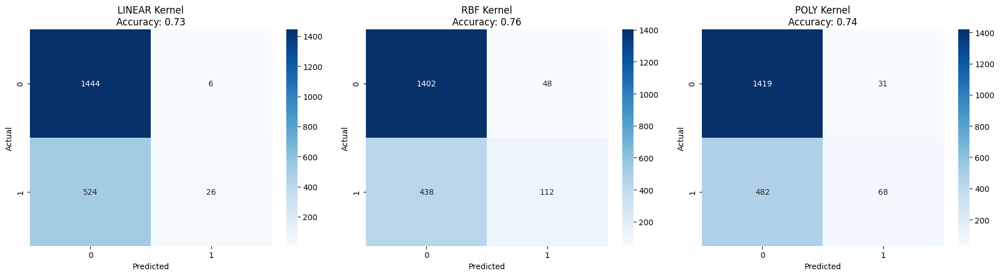

{'linear': {'Accuracy': 0.735},
 'rbf': {'Accuracy': 0.757},
 'poly': {'Accuracy': 0.7435}}

In [6]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Dictionary to store results
results = {}

# Kernel configurations
kernels = {
    'linear': {'kernel': 'linear', 'C': 1.0},
    'rbf': {'kernel': 'rbf', 'C': 1.0},
    'poly': {'kernel': 'poly', 'C': 1.0, 'degree': 3}
}

# Train and evaluate each kernel
for name, params in kernels.items():
    clf = SVC(**params)
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)

    acc = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    results[name] = {
        'model': clf,
        'accuracy': acc,
        'conf_matrix': cm
    }

# Plot confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, (name, result) in zip(axes, results.items()):
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues', ax=ax)
    ax.set_title(f"{name.upper()} Kernel\nAccuracy: {result['accuracy']:.2f}")
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Actual")
plt.tight_layout()
plt.show()

# Prepare summary of results
results_summary = {k: {'Accuracy': v['accuracy']} for k, v in results.items()}
results_summary


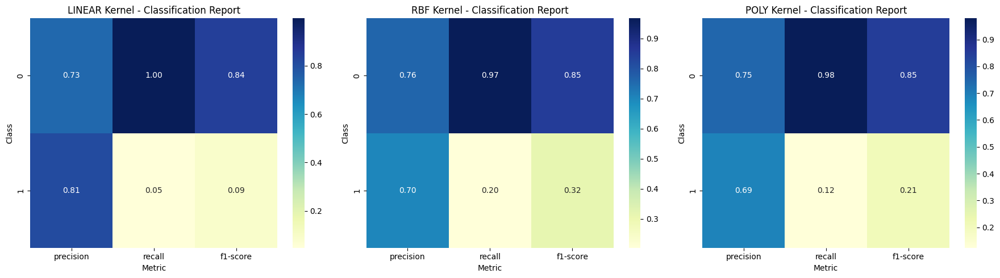

In [7]:
from sklearn.metrics import classification_report
import pandas as pd

# Update your results collection loop to include the classification report
for name, params in kernels.items():
    clf = SVC(**params)
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)

    acc = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)

    results[name] = {
        'model': clf,
        'accuracy': acc,
        'conf_matrix': cm,
        'report': report
    }

# Plot classification reports
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, (name, result) in zip(axes, results.items()):
    # Create a DataFrame excluding support to keep plot clean
    df_report = pd.DataFrame(result['report']).transpose().drop(['accuracy', 'macro avg', 'weighted avg'], errors='ignore')
    sns.heatmap(df_report.iloc[:, :3], annot=True, fmt=".2f", cmap='YlGnBu', ax=ax)
    ax.set_title(f"{name.upper()} Kernel - Classification Report")
    ax.set_ylabel("Class")
    ax.set_xlabel("Metric")
plt.tight_layout()
plt.show()


<ipython-input-8-7c9645def1e5>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(results.keys()), y=list(results.values()), palette='pastel')


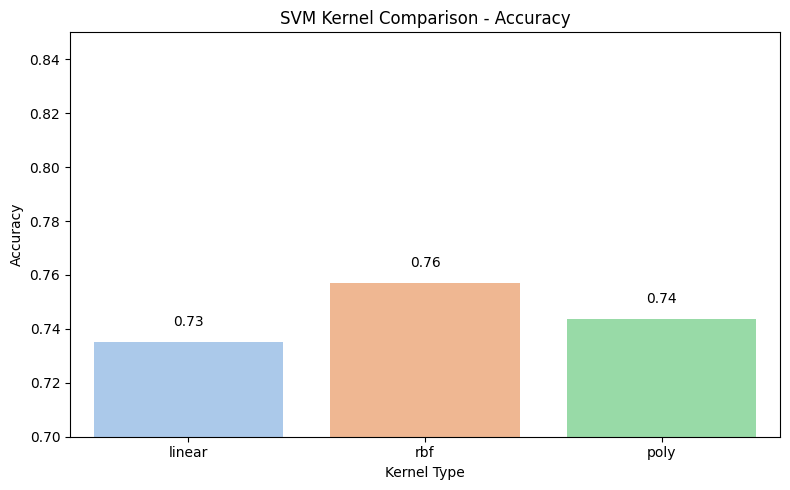

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Manually insert the kernel accuracies from results
results = {
    'linear': 0.735,
    'rbf': 0.757,
    'poly': 0.7435
}

# Plot the bar chart
plt.figure(figsize=(8, 5))
sns.barplot(x=list(results.keys()), y=list(results.values()), palette='pastel')
plt.title("SVM Kernel Comparison - Accuracy")
plt.xlabel("Kernel Type")
plt.ylabel("Accuracy")
plt.ylim(0.70, 0.85)
for i, (kernel, acc) in enumerate(results.items()):
    plt.text(i, acc + 0.005, f"{acc:.2f}", ha='center', va='bottom')
plt.tight_layout()
plt.show()


In [9]:
X_train.head()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,booking_changes,adr,required_car_parking_spaces,total_of_special_requests,avg_temp,humidity,precipitation,snowfall,avg_wind_speed,visibility_km,cloud_cover
47726,56,1,4,2,0.0,0,0,0,0,101.88,0,0,15.2,79.7,0.000,0,20.9,9.1,55.2
61701,104,2,3,2,0.0,0,0,0,0,80.75,0,0,16.2,89.7,10.358,0,13.9,9.7,81.9
80455,33,1,0,1,0.0,0,0,0,0,125.00,0,0,19.6,73.8,0.000,0,27.2,11.2,17.8
68363,51,1,0,2,0.0,0,0,0,0,109.80,0,2,28.0,44.7,0.000,0,21.0,10.9,2.6
29366,0,0,1,2,0.0,0,0,0,0,105.00,0,0,18.2,63.8,0.000,0,16.1,11.6,43.7


In [10]:
X_test.head()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,booking_changes,adr,required_car_parking_spaces,total_of_special_requests,avg_temp,humidity,precipitation,snowfall,avg_wind_speed,visibility_km,cloud_cover
50208,22,2,2,2,0.0,0,0,0,0,109.00,0,1,22.2,76.6,0.0,0,31.4,11.3,26.5
43976,23,2,1,2,0.0,0,0,0,0,137.38,0,0,19.4,64.7,0.0,0,31.2,11.1,27.4
56032,8,1,1,2,0.0,0,0,0,0,80.75,0,1,14.5,74.9,0.0,0,13.5,10.3,6.6
57133,1,0,1,2,0.0,0,0,0,0,100.00,1,0,12.0,83.9,0.0,0,10.8,11.2,50.8
27796,73,1,2,2,0.0,0,0,0,0,40.00,0,0,14.1,76.1,0.0,0,22.7,11.1,33.9


In [11]:
y_train.head()

,is_canceled
47726,1
61701,0
80455,0
68363,0
29366,0


In [12]:
y_test.head()

,is_canceled
50208,1
43976,1
56032,0
57133,0
27796,0


## **AdaBoost**

In [1]:
# Step 1: Reload dataset and select relevant columns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load dataset
file_path = "final_hotel_bookings_df_cleaned.csv"
df = pd.read_csv(file_path)

# Define features and target
selected_features = [
    'lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
    'adults', 'children', 'babies', 'is_repeated_guest',
    'previous_cancellations', 'booking_changes', 'adr',
    'required_car_parking_spaces', 'total_of_special_requests',
    'avg_temp', 'humidity', 'precipitation', 'snowfall', 'avg_wind_speed',
    'visibility_km', 'cloud_cover'
]
target = 'is_canceled'

# Drop missing values
df_clean = df[selected_features + [target]].dropna()

# Step 2: Stratified random sample
X = df_clean[selected_features]
y = df_clean[target]
X_sample, _, y_sample, _ = train_test_split(X, y, train_size=50000, stratify=y, random_state=42)

# Step 3: Split into train/test
X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size=0.2, stratify=y_sample, random_state=42)

# Step 4: Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Output to confirm splits
X_train.shape, X_test.shape, y_train.value_counts(), y_test.value_counts()


((40000, 19),
 (10000, 19),
 is_canceled
 0    28990
 1    11010
 Name: count, dtype: int64,
 is_canceled
 0    7248
 1    2752
 Name: count, dtype: int64)

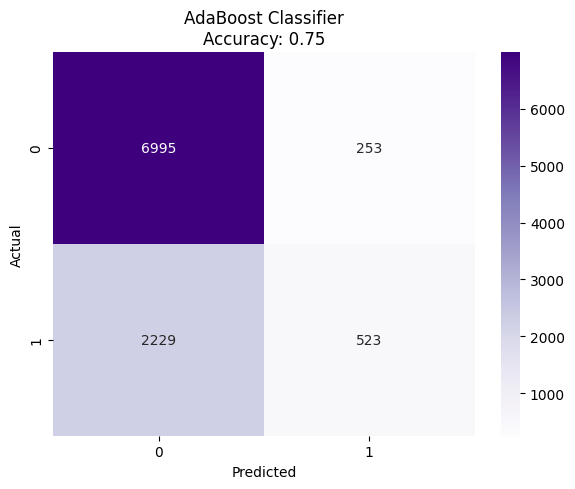

(0.7518,
 {'0': {'precision': 0.758347788378144,
   'recall': 0.9650938189845475,
   'f1-score': 0.8493200582807188,
   'support': 7248.0},
  '1': {'precision': 0.6739690721649485,
   'recall': 0.1900436046511628,
   'f1-score': 0.29648526077097503,
   'support': 2752.0},
  'accuracy': 0.7518,
  'macro avg': {'precision': 0.7161584302715462,
   'recall': 0.5775687118178552,
   'f1-score': 0.5729026595258468,
   'support': 10000.0},
  'weighted avg': {'precision': 0.7351267656762726,
   'recall': 0.7518,
   'f1-score': 0.6971799220060373,
   'support': 10000.0}})

In [3]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score
import matplotlib.pyplot as plt

# Train AdaBoost model with DecisionTree base estimator
ada_model = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=1),
    n_estimators=100,
    learning_rate=1.0,
    random_state=42
)

# Fit the model on training data
ada_model.fit(X_train_scaled, y_train)

# Predict on test data
y_pred_ada = ada_model.predict(X_test_scaled)

# Evaluate performance
accuracy_ada = accuracy_score(y_test, y_pred_ada)
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)
class_report_ada = classification_report(y_test, y_pred_ada, output_dict=True)

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_ada, annot=True, fmt='d', cmap='Purples')
plt.title(f"AdaBoost Classifier\nAccuracy: {accuracy_ada:.2f}")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# Return metrics
accuracy_ada, class_report_ada


In [4]:
# Show classification report
class_report_ada = classification_report(y_test, y_pred_ada, output_dict=True)
df_class_report_ada = pd.DataFrame(class_report_ada).transpose().round(3)

In [5]:
df_class_report_ada

,precision,recall,f1-score,support
0,0.758,0.965,0.849,7248.000
1,0.674,0.190,0.296,2752.000
accuracy,0.752,0.752,0.752,0.752
macro avg,0.716,0.578,0.573,10000.000
weighted avg,0.735,0.752,0.697,10000.000


In [6]:
X_train.head()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,booking_changes,adr,required_car_parking_spaces,total_of_special_requests,avg_temp,humidity,precipitation,snowfall,avg_wind_speed,visibility_km,cloud_cover
29669,62,1,4,1,0.0,0,0,0,3,85.0,0,0,19.7,68.6,0.000,0,35.7,10.9,64.8
71901,42,0,2,2,0.0,0,0,0,0,72.0,0,0,17.7,86.7,15.887,0,21.7,10.1,60.6
37062,2,0,2,2,0.0,0,0,0,0,115.0,0,0,13.3,85.5,0.009,0,14.5,10.2,37.4
46970,69,2,4,2,1.0,0,0,0,0,94.2,0,1,13.9,86.0,0.000,0,24.9,11.8,44.1
53195,6,0,1,1,0.0,0,1,0,0,67.0,0,1,14.8,52.6,0.000,0,20.8,11.9,2.5


In [7]:
X_test.head()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,booking_changes,adr,required_car_parking_spaces,total_of_special_requests,avg_temp,humidity,precipitation,snowfall,avg_wind_speed,visibility_km,cloud_cover
78908,58,2,0,3,0.0,0,0,0,0,196.20,0,4,18.5,68.6,0.000,0,24.3,11.1,62.5
64414,9,0,2,2,0.0,0,0,0,0,129.20,0,0,20.8,63.5,0.000,0,37.3,12.2,22.0
45361,52,0,3,2,0.0,0,0,0,0,79.20,0,2,14.0,88.2,0.005,0,14.3,9.9,68.5
15543,148,2,1,2,0.0,0,0,0,0,100.33,0,3,14.5,86.5,0.500,0,11.0,10.3,86.9
77890,7,1,3,2,0.0,0,0,0,0,108.80,0,0,13.5,81.3,0.000,0,22.1,11.8,66.7


In [8]:
y_train.head()

,is_canceled
29669,0
71901,0
37062,0
46970,1
53195,0


In [9]:
y_test.head()

,is_canceled
78908,0
64414,0
45361,1
15543,0
77890,0
